In [88]:
import os
import json
import s3fs
from dotenv import load_dotenv
import random
import xarray as xr
from tqdm import tqdm
from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import torch
from torch.utils.data import Dataset,DataLoader, Subset
from torch.utils.data import random_split
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms.functional as TF

import wandb
from itertools import product

import seaborn as sns
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split

from transformers import SegformerForSemanticSegmentation,SegformerFeatureExtractor

In [89]:
load_dotenv()
s3_options = {
    "key": os.getenv('MINIO_ACCESS_KEY'),
    "secret": os.getenv('MINIO_SECRET_KEY'),
    "client_kwargs": {'endpoint_url': os.getenv('MINIO_ENDPOINT_URL', 'http://localhost:9000')},
    "config_kwargs": {'s3': {'addressing_style': 'path'}} # Important for MinIO
}
s3 = s3fs.S3FileSystem(**s3_options)
bucket_name = os.getenv('MINIO_BUCKET_NAME', 'fusion-lake')
with open('cloud_masks_data.json', 'r') as f:
    data = json.load(f)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [90]:
def extract_patch(ds, patch_row, patch_col, patch_size=384):
    y_start = patch_row * patch_size
    x_start = patch_col * patch_size

    # Handle edge cases so we don't go out of bounds
    y_end = min(y_start + patch_size, ds.dims['y'])
    x_end = min(x_start + patch_size, ds.dims['x'])

    patch = ds.isel(
        y=slice(y_start, y_end),
        x=slice(x_start, x_end)
    )
    return patch

In [102]:
class CloudBalancedDatasetWithSynthesis(Dataset):
    def __init__(self, data_dict, s3_options, bucket_name, samples_per_bin=200, patch_size=384):
        """
        data_dict: dict of the form {'8': high_res_dict, '10': high_res_dict, ...}
        where each high_res_dict is a dict with keys as cloud bins like '0', '1', etc.
        """
        self.data_dict = data_dict
        self.keys = list(data_dict.keys())  # Outer keys: '8', '10', '30', etc.
        self.samples_per_bin = samples_per_bin
        self.s3_options = s3_options
        self.bucket_name = bucket_name
        self.patch_size = patch_size

        self.cloud_bins = self._infer_common_bins()
        self.total_samples = len(self.keys) * len(self.cloud_bins) * self.samples_per_bin
        
        self.prepare_epoch()
        
    def _infer_common_bins(self):
        """Assume all high_res dicts share the same cloud bins."""
        any_key = next(iter(self.data_dict))
        return list(self.data_dict[any_key].keys())

    def prepare_epoch(self):
        self.sampled_data = []

        for group_key in self.keys:
            high_res = self.data_dict[group_key]
            clear_pool = [x for x in high_res['0'] if self.is_valid(x)]

            if not clear_pool:
                raise ValueError(f"No valid clear images in group {group_key}")

            for bin_key in self.cloud_bins:
                bin_images = [x for x in high_res[bin_key] if self.is_valid(x)]

                if len(bin_images) >= self.samples_per_bin:
                    selected = random.sample(bin_images, self.samples_per_bin)
                    self.sampled_data.extend([('real', x, group_key, bin_key) for x in selected])
                else:
                    self.sampled_data.extend([('real', x, group_key, bin_key) for x in bin_images])
                    deficit = self.samples_per_bin - len(bin_images)

                    for _ in range(deficit):
                        cloudy_image = random.choice(bin_images) if bin_images else random.choice(clear_pool)
                        clear_image = random.choice(clear_pool)
                        self.sampled_data.append(('synthetic', (clear_image, cloudy_image), group_key, bin_key))

        if not self.sampled_data:
            raise ValueError("No usable samples could be prepared.")
        self.sampled_data = [item for item in self.sampled_data if item[0] == 'real']
        random.shuffle(self.sampled_data)
        print(f"✅ Prepared {len(self.sampled_data)} samples from {len(self.keys)} groups × {len(self.cloud_bins)} bins × {self.samples_per_bin}.")

    def __len__(self):
        return len(self.sampled_data)

    def __getitem__(self, idx):
        tag, data, group_key, bin_key = self.sampled_data[idx]
    
        def to_tensor_and_normalize(patch):
            patch = patch.astype(np.float32)
            patch = np.nan_to_num(patch)
            if patch.max() > patch.min():
                patch = (patch - patch.min()) / (patch.max() - patch.min())
        
            # If more than 3 bands, truncate to first 3
            if patch.shape[-1] > 3:
                patch = patch[..., :3]
        
            # Channel-first format for torch: (C, H, W)
            return torch.from_numpy(patch).permute(2, 0, 1)
    
        if tag == 'real':
            row, col, zarr_path, cloud_pct = data
    
            # Paths
            image_path = f"s3://{self.bucket_name}/{zarr_path}"
            mask_path = f"s3://{self.bucket_name}/{zarr_path.replace('raw', 'mask')}"
    
            # Load Zarr datasets
            image_ds = xr.open_zarr(image_path, storage_options=self.s3_options, consolidated=True, chunks={})
            mask_ds = xr.open_zarr(mask_path, storage_options=self.s3_options, consolidated=True, chunks={})
    
            # Extract patches
            image_patch = extract_patch(image_ds, row, col, self.patch_size)
            mask_patch = extract_patch(mask_ds, row, col, self.patch_size)
    
            # Extract arrays
            band = list(image_patch.keys())[0]
            image = image_patch[band].load().values
            mask = mask_patch[list(mask_patch.keys())[0]].load().values
    
            # Postprocess
            image = to_tensor_and_normalize(image)
            mask = torch.from_numpy((np.nan_to_num(mask) > 0).astype(np.float32)).unsqueeze(0)  # (1, H, W)
    
        else:  # synthetic
            clear_data, cloud_data = data
            synthetic_image, mask_np = self.overlay_and_extract(clear_data, cloud_data)

            image = to_tensor_and_normalize(synthetic_image)
            mask = torch.from_numpy((mask_np > 0).astype(np.float32)).unsqueeze(0)
    
        # Swap BGR → RGB if group_key == '30'
        if str(group_key) == '30':
            image = image[[2, 1, 0], :, :]  # Swap channels

        # image = TF.resize(image, [512, 512])
        # mask = TF.resize(mask, [512, 512], interpolation=TF.InterpolationMode.NEAREST)

        return {
            "pixel_values": image,                   # For SegFormer input
            "mask": mask.long().squeeze(0)           # For training target (CrossEntropyLoss)
        }
    


    def overlay_and_extract(self, clear_image_data, cloud_image_data):
        clear_row, clear_col, clear_zarr_link, _ = clear_image_data
        cloud_row, cloud_col, cloud_zarr_link, _ = cloud_image_data

        clear_path = f"s3://{self.bucket_name}/{clear_zarr_link}"
        cloud_path = f"s3://{self.bucket_name}/{cloud_zarr_link}"
        mask_path = f"s3://{self.bucket_name}/{cloud_zarr_link.replace('raw', 'mask')}"

        clear_ds = xr.open_zarr(clear_path, storage_options=self.s3_options, consolidated=True, chunks={})
        cloud_ds = xr.open_zarr(cloud_path, storage_options=self.s3_options, consolidated=True, chunks={})
        mask_ds = xr.open_zarr(mask_path, storage_options=self.s3_options, consolidated=True, chunks={})

        clear_patch = extract_patch(clear_ds, clear_row, clear_col, self.patch_size)
        cloud_patch = extract_patch(cloud_ds, cloud_row, cloud_col, self.patch_size)
        mask_patch = extract_patch(mask_ds, cloud_row, cloud_col, self.patch_size)

        clear = clear_patch[list(clear_patch.keys())[0]].load().values.astype(np.float32)
        cloud = cloud_patch[list(cloud_patch.keys())[0]].load().values.astype(np.float32)
        mask = mask_patch[list(mask_patch.keys())[0]].load().values

        clear = np.nan_to_num(clear)
        cloud = np.nan_to_num(cloud)
        mask = (np.nan_to_num(mask) > 0).astype(bool)

        if clear.shape != cloud.shape:
            raise ValueError(f"Shape mismatch: {clear.shape} vs {cloud.shape}")

        # Normalize
        for img in [clear, cloud]:
            if img.max() > img.min():
                img -= img.min()
                img /= (img.max() + 1e-8)

        # Overlay cloud onto clear
        mask_3d = np.stack([mask] * clear.shape[-1], axis=-1)
        synthetic = np.where(mask_3d, cloud, clear).astype(np.float32)

        # Cloud cover %
        # cloud_pct = round(100.0 * np.sum(mask) / mask.size, 2)

        return synthetic,  mask
    
    def is_valid(self, sample):
        row, col, zarr_path, _ = sample
        ds = xr.open_zarr(
            store=f"s3://{self.bucket_name}/{zarr_path}",
            storage_options=self.s3_options,
            consolidated=True,
            chunks={}
        )
        patch = extract_patch(ds, row, col, patch_size=self.patch_size)
        band = list(patch.keys())[0]
        data = patch[band]
        return data.shape[0] == self.patch_size and data.shape[1] == self.patch_size


In [28]:
dataset = CloudBalancedDatasetWithSynthesis(data,s3_options,bucket_name,samples_per_bin=500)

✅ Prepared 14355 samples from 3 groups × 21 bins × 500.


In [60]:
segformer_dataset = CloudBalancedDatasetWithSynthesis(data, s3_options, bucket_name, samples_per_bin=500)

✅ Prepared 14355 samples from 3 groups × 21 bins × 500.


In [105]:
segformer_dataset = torch.load('segformer_dataset.pt')

In [24]:
torch.save(segformer_dataset, 'segformer_dataset.pt')

In [104]:
dataset = torch.load('dataset_unet.pth')

In [82]:
total_len = len(dataset)
train_len = int(0.8 * total_len)
val_len = int(0.1 * total_len)
test_len = total_len - train_len - val_len

# Split the dataset (same every time with seed)
train_dataset, val_dataset, test_dataset = random_split(
    dataset,
    [train_len, val_len, test_len],
    generator=torch.Generator().manual_seed(42)  # Ensures reproducibility
)

In [83]:
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

In [84]:
# Step 1: Organize indices by (group_key, bin_key)
bins = defaultdict(list)
for idx, (_, _, group_key, bin_key) in enumerate(dataset.sampled_data):
    bins[(group_key, bin_key)].append(idx)

# Step 2: Split each bin separately
train_idx, val_idx, test_idx = [], [], []

for bin_key, indices in bins.items():
    train_i, rest = train_test_split(indices, train_size=train_ratio, random_state=42)
    val_i, test_i = train_test_split(rest, test_size=test_ratio / (val_ratio + test_ratio), random_state=42)
    
    train_idx.extend(train_i)
    val_idx.extend(val_i)
    test_idx.extend(test_i)

# Step 3: Use Subset instead of random_split
train_dataset = torch.utils.data.Subset(dataset, train_idx)
val_dataset = torch.utils.data.Subset(dataset, val_idx)
test_dataset = torch.utils.data.Subset(dataset, test_idx)

In [85]:
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

In [106]:
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

In [107]:
# Step 1: Organize indices by (group_key, bin_key)
bins = defaultdict(list)
for idx, (_, _, group_key, bin_key) in enumerate(segformer_dataset.sampled_data):
    bins[(group_key, bin_key)].append(idx)

# Step 2: Split each bin separately
train_idx, val_idx, test_idx = [], [], []

for bin_key, indices in bins.items():
    train_i, rest = train_test_split(indices, train_size=train_ratio, random_state=42)
    val_i, test_i = train_test_split(rest, test_size=test_ratio / (val_ratio + test_ratio), random_state=42)
    
    train_idx.extend(train_i)
    val_idx.extend(val_i)
    test_idx.extend(test_i)

# Step 3: Use Subset instead of random_split
train_dataset = torch.utils.data.Subset(segformer_dataset, train_idx)
val_dataset = torch.utils.data.Subset(segformer_dataset, val_idx)
segformer_test_dataset = torch.utils.data.Subset(segformer_dataset, test_idx)

In [65]:
total_len = len(dataset)
train_len = int(0.8 * total_len)
val_len = int(0.1 * total_len)
test_len = total_len - train_len - val_len

# Split the dataset (same every time with seed)
train_dataset, val_dataset, segformer_test_dataset = random_split(
    dataset,
    [train_len, val_len, test_len],
    generator=torch.Generator().manual_seed(42)  # Ensures reproducibility
)

In [95]:
segformer_test_loader = DataLoader(segformer_test_dataset, batch_size=1, shuffle=False, num_workers=0)

In [21]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        self.down1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.down2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.down3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.down4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.conv4 = DoubleConv(1024, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv3 = DoubleConv(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv2 = DoubleConv(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv1 = DoubleConv(128, 64)

        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(self.pool1(d1))
        d3 = self.down3(self.pool2(d2))
        d4 = self.down4(self.pool3(d3))
        bn = self.bottleneck(self.pool4(d4))

        u4 = self.up4(bn)
        u4 = torch.cat([u4, d4], dim=1)
        u4 = self.conv4(u4)

        u3 = self.up3(u4)
        u3 = torch.cat([u3, d3], dim=1)
        u3 = self.conv3(u3)

        u2 = self.up2(u3)
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.conv2(u2)

        u1 = self.up1(u2)
        u1 = torch.cat([u1, d1], dim=1)
        u1 = self.conv1(u1)

        return torch.sigmoid(self.out(u1))  # Output shape: (B, 1, H, W)

In [40]:
def compute_iou(pred, target, threshold=0.5):
    pred_bin = (pred > threshold).float()
    intersection = (pred_bin * target).sum(dim=(1,2,3))
    union = ((pred_bin + target) > 0).float().sum(dim=(1,2,3))
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.mean().item()

def compute_iou_segformer(preds, targets, num_classes=2):
    ious = []
    preds = preds.view(-1)
    targets = targets.view(-1)
    for cls in range(num_classes):
        pred_inds = (preds == cls)
        target_inds = (targets == cls)
        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()
        if union == 0:
            ious.append(1.0)  # Perfect if nothing present
        else:
            ious.append(intersection / union)
    return sum(ious) / len(ious)


In [23]:
def evaluate_model(model_path, test_loader, device):
    model = UNet(in_channels=3, out_channels=1).to(device)
    model.load_state_dict(torch.load(model_path)['model_state_dict'])
    model.eval()

    criterion = torch.nn.BCELoss()
    total_iou = total_loss = total_correct = total_total = 0

    # Bin confusion matrix tracker
    bin_stats = defaultdict(lambda: {'TP': 0, 'TN': 0, 'FP': 0, 'FN': 0, 'count': 0})

    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Testing"):
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            loss = criterion(preds, masks)
            iou = compute_iou(preds, masks)

            total_loss += loss.item()
            total_iou += iou

            pred_bin = (preds > 0.5).float()
            total_correct += (pred_bin == masks).sum().item()
            total_total += masks.numel()

            # Per-sample confusion matrix binning
            for i in range(masks.shape[0]):
                gt = masks[i].squeeze()
                pr = pred_bin[i].squeeze()

                cloud_percentage = (gt.sum() / gt.numel()).item()
                bin_key = f"{int(cloud_percentage * 100) // 10 * 10}-{int(cloud_percentage * 100) // 10 * 10 + 10}%"

                TP = ((gt == 1) & (pr == 1)).sum().item()
                TN = ((gt == 0) & (pr == 0)).sum().item()
                FP = ((gt == 0) & (pr == 1)).sum().item()
                FN = ((gt == 1) & (pr == 0)).sum().item()

                bin_stats[bin_key]['TP'] += TP
                bin_stats[bin_key]['TN'] += TN
                bin_stats[bin_key]['FP'] += FP
                bin_stats[bin_key]['FN'] += FN
                bin_stats[bin_key]['count'] += 1

    avg_loss = total_loss / len(test_loader)
    avg_iou = total_iou / len(test_loader)
    avg_accuracy = total_correct / total_total

    print(f"\n🧪 Test Loss: {avg_loss:.4f}, Test IoU: {avg_iou:.4f}, Test Accuracy: {avg_accuracy:.4f}\n")

    print("📊 Confusion stats by cloud percentage bin:")
    for bin_key in sorted(bin_stats.keys()):
        stats = bin_stats[bin_key]
        print(f"  {bin_key}: TP={stats['TP']}, TN={stats['TN']}, FP={stats['FP']}, FN={stats['FN']}, Samples={stats['count']}")


In [40]:
evaluate_model('unet_200_1e-4_8', test_loader, device)

Testing: 100%|██████████| 788/788 [05:55<00:00,  2.22it/s]


🧪 Test Loss: 0.1143, Test IoU: 0.8907, Test Accuracy: 0.9578

📊 Confusion stats by cloud percentage bin:
  0-10%: TP=1438056, TN=44678123, FP=776399, FN=293342, Samples=320
  10-20%: TP=5759176, TN=36530764, FP=807081, FN=697411, Samples=297
  100-110%: TP=18622723, TN=0, FP=0, FN=251645, Samples=128
  20-30%: TP=9267036, TN=29638348, FP=901848, FN=890624, Samples=276
  30-40%: TP=13989428, TN=26950144, FP=916302, FN=906366, Samples=290
  40-50%: TP=18532013, TN=23559660, FP=961120, FN=1331463, Samples=301
  50-60%: TP=22645725, TN=18685559, FP=1092751, FN=1517853, Samples=298
  60-70%: TP=27200195, TN=14476217, FP=785508, FN=1185056, Samples=296
  70-80%: TP=34263925, TN=10862483, FP=843790, FN=1363178, Samples=321
  80-90%: TP=38628045, TN=6514355, FP=613225, FN=1725207, Samples=322
  90-100%: TP=40967820, TN=1658416, FP=402697, FN=1355323, Samples=301


In [ ]:
def bin_percentage(val):
    """Bin a value between 0 and 1 into a 10% bin label"""
    bin_floor = int(val * 100) // 10 * 10
    return f"{bin_floor}-{bin_floor+10}%"

def evaluate_model_with_heatmap(model_path, test_loader, device, model_type='unet'):
    if model_type == 'unet':
        model = UNet(in_channels=3, out_channels=1).to(device)
        model.load_state_dict(torch.load(model_path)['model_state_dict'])
        model.eval()
        bin_confusion = defaultdict(lambda: defaultdict(int))

        TP = TN = FP = FN = 0
        
        with torch.no_grad():
            for batch in tqdm(test_loader, desc="Evaluating"):

                images = batch["pixel_values"].to(device)
                masks = batch["mask"].to(device)
                preds = model(images)
                preds = (preds > 0.5).float()

                for i in range(images.shape[0]):
                    gt = masks[i].squeeze()
                    pr = preds[i].squeeze()

                    gt_pct = gt.sum().item() / gt.numel()
                    pr_pct = pr.sum().item() / pr.numel()

                    gt_bin = bin_percentage(gt_pct)
                    pr_bin = bin_percentage(pr_pct)

                    bin_confusion[gt_bin][pr_bin] += 1
                    
                preds_flat = preds.view(-1)
                masks_flat = masks.view(-1)
                
                TP += ((preds_flat == 1) & (masks_flat == 1)).sum().item()
                TN += ((preds_flat == 0) & (masks_flat == 0)).sum().item()
                FP += ((preds_flat == 1) & (masks_flat == 0)).sum().item()
                FN += ((preds_flat == 0) & (masks_flat == 1)).sum().item()

        sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0
        specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
        
        print(f"📈 Sensitivity (Recall for clouds): {sensitivity:.4f}")
        print(f"📉 Specificity (Recall for clear):  {specificity:.4f}") 
        
        # Sorted bins
        bins = [f"{i}-{i+10}%" for i in range(0, 100, 10)]

        # Raw count matrix
        raw_matrix = np.zeros((len(bins), len(bins)), dtype=int)
        for i, gt_bin in enumerate(bins):
            for j, pr_bin in enumerate(bins):
                raw_matrix[i, j] = bin_confusion[gt_bin][pr_bin]

        # Normalize rows to get percentage matrix
        row_sums = raw_matrix.sum(axis=1, keepdims=True)
        # Avoid divide-by-zero: set zero-row sums to 1
        row_sums[row_sums == 0] = 1
        percentage_matrix = (raw_matrix / row_sums) * 100  # Now in percentages

        # Plot heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(percentage_matrix, annot=True, fmt='.1f', xticklabels=bins, yticklabels=bins, cmap="YlGnBu")
        plt.xlabel("Predicted Cloud Cover Bin")
        plt.ylabel("Ground Truth Cloud Cover Bin")
        plt.title(f"Normalized Confusion Heatmap (% per Ground Truth Bin) {model_type.upper()}")
        plt.tight_layout()
        plt.show()
    else:
        # print(f"🔍 Evaluating {checkpoint_path}")
        
        # Load model
        model = SegformerForSemanticSegmentation.from_pretrained(
            "nvidia/segformer-b0-finetuned-ade-512-512",
            num_labels=2,
            ignore_mismatched_sizes=True
        )
        checkpoint = torch.load(model_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        model.to(device)
        model.eval()

        total_correct = 0
        total_pixels = 0
        total_iou = 0

        # Confusion bin matrix: (gt_bin, pred_bin) -> count
        bin_confusion = defaultdict(lambda: defaultdict(int))

        TP = TN = FP = FN = 0
        
        with torch.no_grad():
            for batch in tqdm(test_loader, desc="Testing"):
                images = batch["pixel_values"].to(device)
                masks = batch["mask"].to(device)  # shape: (B, H, W)

                images = F.interpolate(images, size=(512, 512), mode='bilinear', align_corners=False)
                masks = masks.unsqueeze(1)  # shape: (B, 1, H, W) for interpolation
                masks = F.interpolate(masks.float(), size=(512, 512), mode='nearest')
                masks = masks.squeeze(1).long()

                outputs = model(pixel_values=images)
                logits = outputs.logits  # shape: (B, 2, H_out, W_out)

                logits_resized = F.interpolate(logits, size=masks.shape[-2:], mode="bilinear", align_corners=False)
                preds = logits_resized.argmax(dim=1)  # shape: (B, H, W)

                preds = F.interpolate(preds.unsqueeze(1).float(), size=(384, 384), mode='nearest').squeeze(1).long()
                masks = F.interpolate(masks.unsqueeze(1).float(), size=(384, 384), mode='nearest').squeeze(1).long()

                total_correct += (preds == masks).sum().item()
                total_pixels += masks.numel()
                total_iou += compute_iou_segformer(preds, masks)
                
                preds_flat = preds.view(-1)
                masks_flat = masks.view(-1)
                
                TP += ((preds_flat == 1) & (masks_flat == 1)).sum().item()
                TN += ((preds_flat == 0) & (masks_flat == 0)).sum().item()
                FP += ((preds_flat == 1) & (masks_flat == 0)).sum().item()
                FN += ((preds_flat == 0) & (masks_flat == 1)).sum().item()
                

                for i in range(masks.shape[0]):
                    gt = masks[i]
                    pr = preds[i]

                    gt_pct = gt.sum().item() / gt.numel() 
                    pr_pct = pr.sum().item() / pr.numel()

                    gt_bin = bin_percentage(gt_pct)
                    pr_bin = bin_percentage(pr_pct)

                    bin_confusion[gt_bin][pr_bin] += 1
                    
                    # print(gt_pct_list)
                    # print(pr_pct_list)
                    
                    # break
                # break
        acc = total_correct / total_pixels
        avg_iou = total_iou / len(test_loader)
        sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0
        specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
        
        print(f"\n📊 Test Accuracy: {acc:.4f}, Test IoU: {avg_iou:.4f}\n")
        print(f"📈 Sensitivity (Recall for clouds): {sensitivity:.4f}")
        print(f"📉 Specificity (Recall for clear):  {specificity:.4f}") 
        

        # Format confusion matrix
        bins = [f"{i}-{i+10}%" for i in range(0, 100, 10)]
        raw_matrix = np.zeros((len(bins), len(bins)), dtype=int)
        for i, gt_bin in enumerate(bins):
            for j, pr_bin in enumerate(bins):
                raw_matrix[i, j] = bin_confusion[gt_bin][pr_bin]

        # Normalize rows to percentages
        row_sums = raw_matrix.sum(axis=1, keepdims=True)
        row_sums[row_sums == 0] = 1
        perc_matrix = (raw_matrix / row_sums) * 100

        # Plot heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(perc_matrix, annot=True, fmt=".1f", xticklabels=bins, yticklabels=bins, cmap="YlGnBu")
        plt.xlabel("Predicted Cloud Cover Bin")
        plt.ylabel("Ground Truth Cloud Cover Bin")
        plt.title(f"Normalized Confusion Heatmap (% per GT Bin) {model_type.upper()}")
        plt.tight_layout()
        plt.show()
        
        # print(gt_pct_list)
        # print(pr_pct_list)
    

Evaluating: 100%|██████████| 788/788 [05:51<00:00,  2.24it/s]


📈 Sensitivity (Recall for clouds): 0.9785
📉 Specificity (Recall for clear):  0.9654


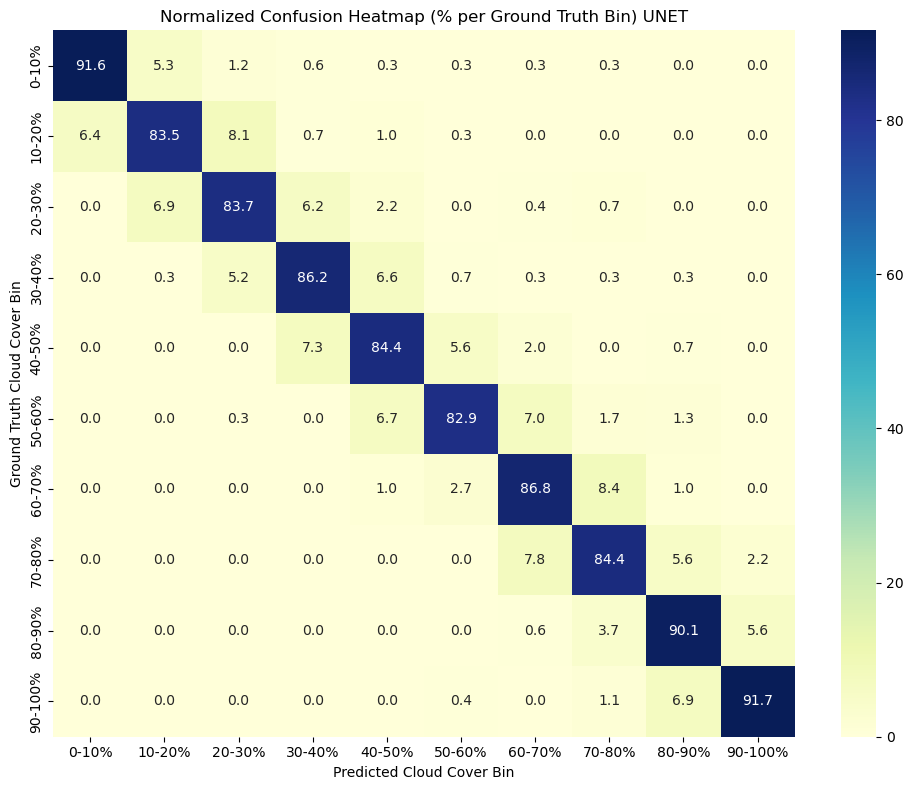

In [13]:
evaluate_model_with_heatmap('unet_500_0.0001_16', test_loader, device)

Evaluating: 100%|██████████| 788/788 [06:39<00:00,  1.97it/s]


📈 Sensitivity (Recall for clouds): 0.9718
📉 Specificity (Recall for clear):  0.9762


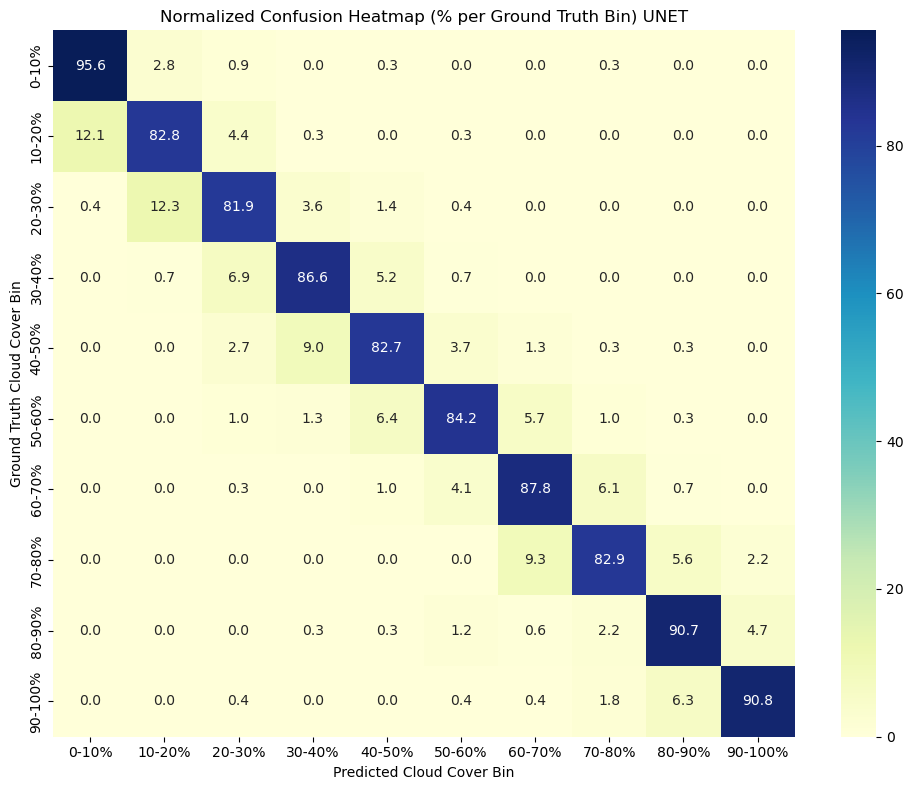

In [15]:
evaluate_model_with_heatmap('unet_500_0.0001_16_0.5', test_loader, device)

Evaluating: 100%|██████████| 788/788 [06:11<00:00,  2.12it/s]


📈 Sensitivity (Recall for clouds): 0.9821
📉 Specificity (Recall for clear):  0.9774


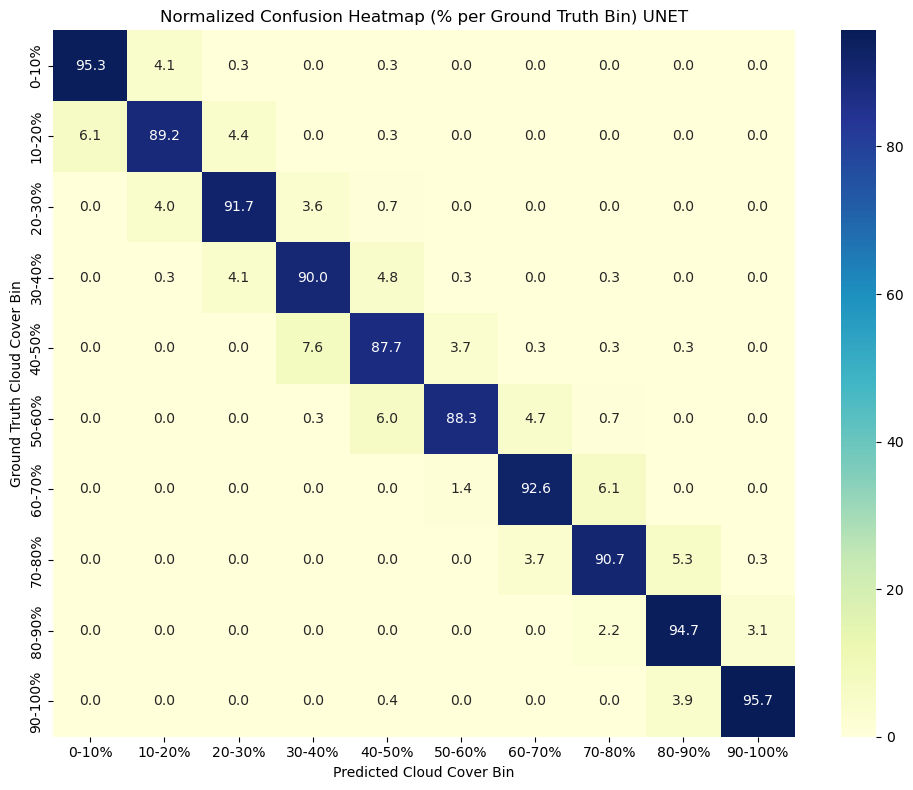

In [12]:
evaluate_model_with_heatmap('unet_500_0.0001_16_2', test_loader, device) 

Evaluating: 100%|██████████| 3150/3150 [02:18<00:00, 22.72it/s]


📈 Sensitivity (Recall for clouds): 0.9819
📉 Specificity (Recall for clear):  0.9780


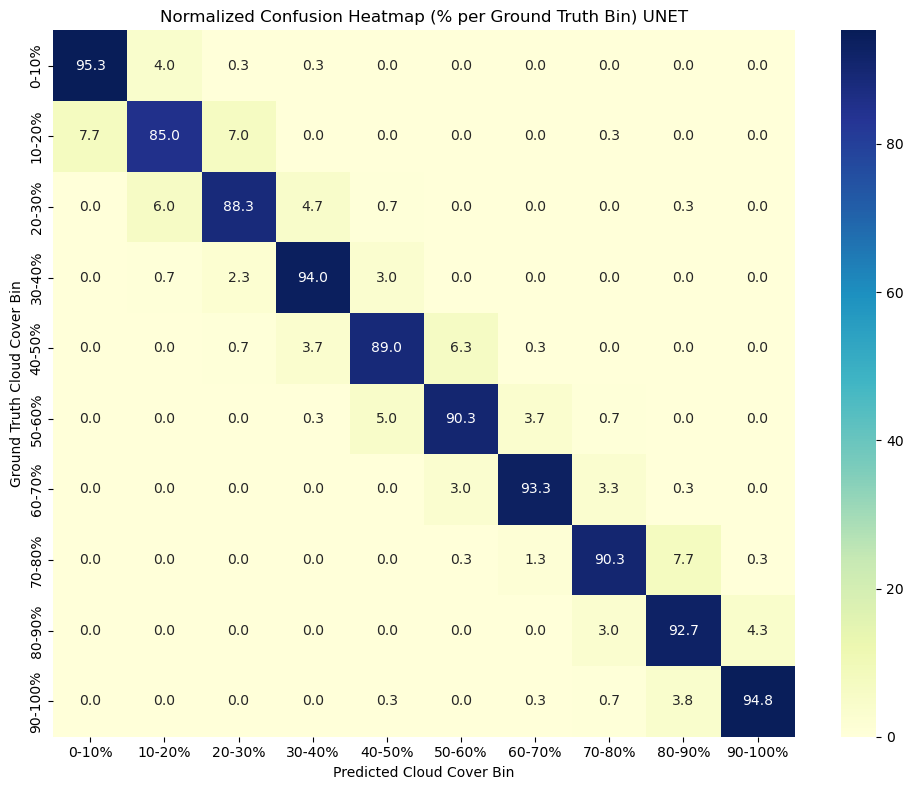

In [86]:
evaluate_model_with_heatmap('unet_500_0.0001_16_2', test_loader, device) 

Evaluating: 100%|██████████| 788/788 [06:02<00:00,  2.18it/s]


📈 Sensitivity (Recall for clouds): 0.9697
📉 Specificity (Recall for clear):  0.9687


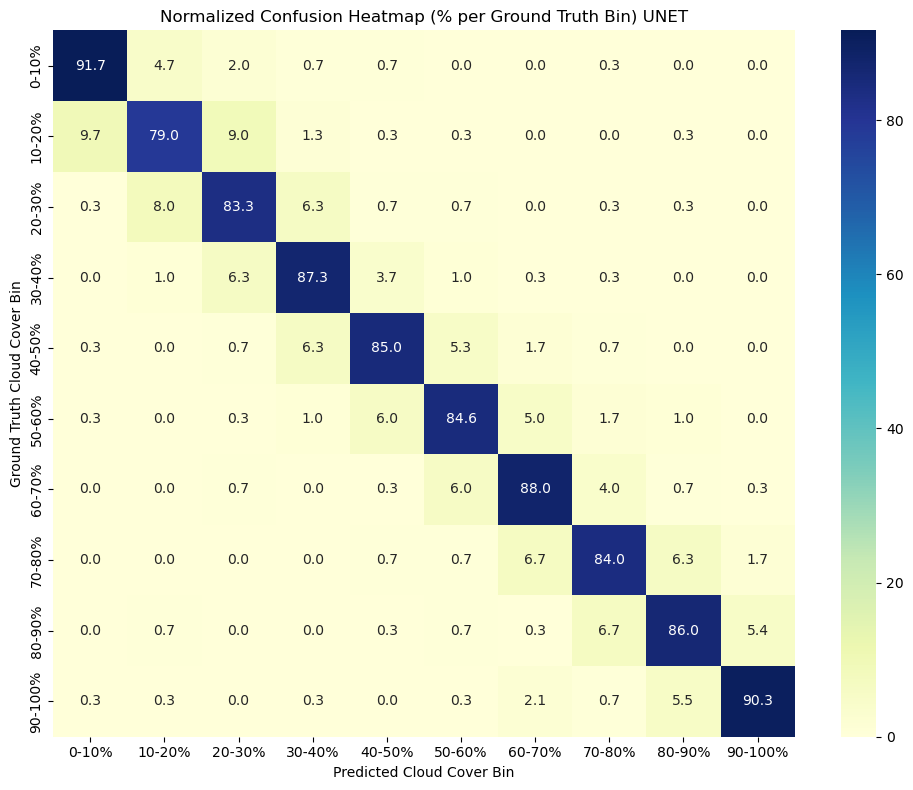

In [47]:
evaluate_model_with_heatmap('unet_300_0.0001_8', test_loader, device)

### Unbalanced data, unnormalized cloud masking

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2329/2329 [05:02<00:00,  7.70it/s]



📊 Test Accuracy: 0.9826, Test IoU: 0.9052



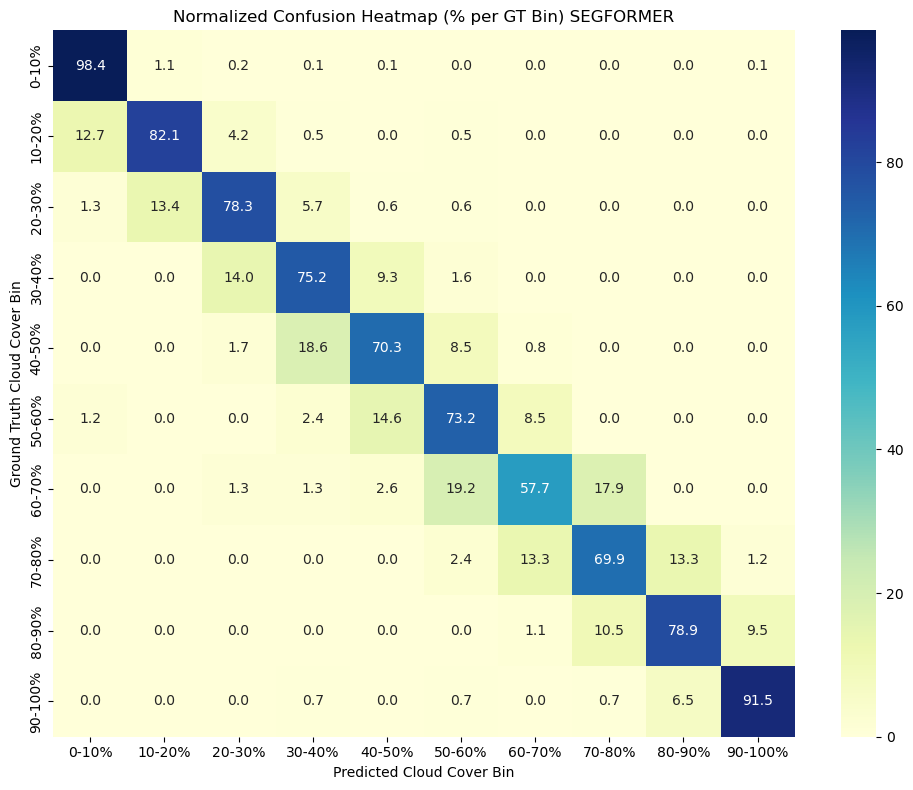

In [15]:
evaluate_model_with_heatmap('segformer_500_0.0001_16.pt', segformer_test_loader, device, model_type='segformer')

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2343/2343 [04:51<00:00,  8.02it/s]



📊 Test Accuracy: 0.9832, Test IoU: 0.8643

📈 Sensitivity (Recall for clouds): 0.9596
📉 Specificity (Recall for clear):  0.9895


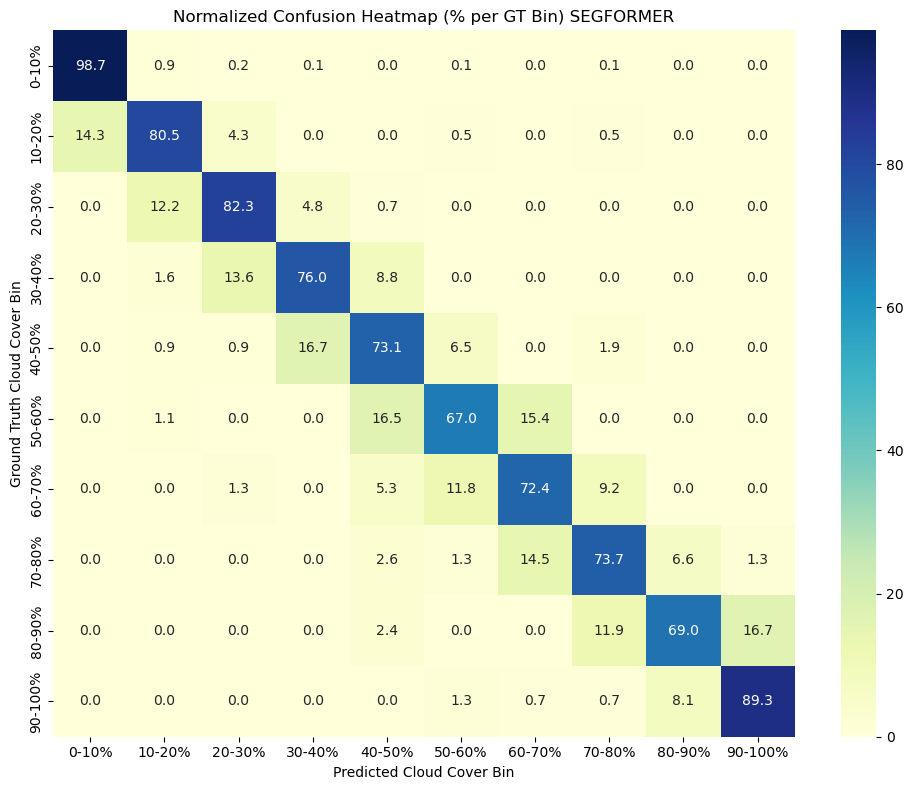

In [75]:
evaluate_model_with_heatmap('segformer_500_0.0001_16.pt', segformer_test_loader, device, model_type='segformer')

### Unbalanced data, normalized cloud masking

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2329/2329 [05:18<00:00,  7.32it/s]



📊 Test Accuracy: 0.9839, Test IoU: 0.9077



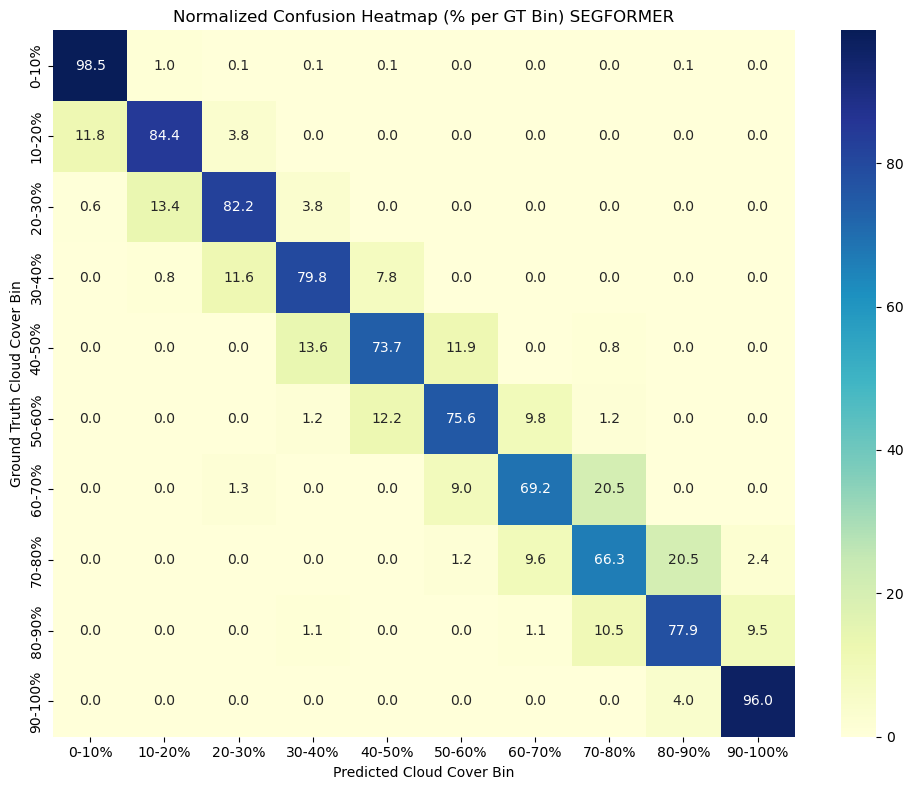

In [14]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_n.pt', segformer_test_loader, device, model_type='segformer')

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2343/2343 [05:02<00:00,  7.75it/s]



📊 Test Accuracy: 0.9849, Test IoU: 0.8724

📈 Sensitivity (Recall for clouds): 0.9675
📉 Specificity (Recall for clear):  0.9896


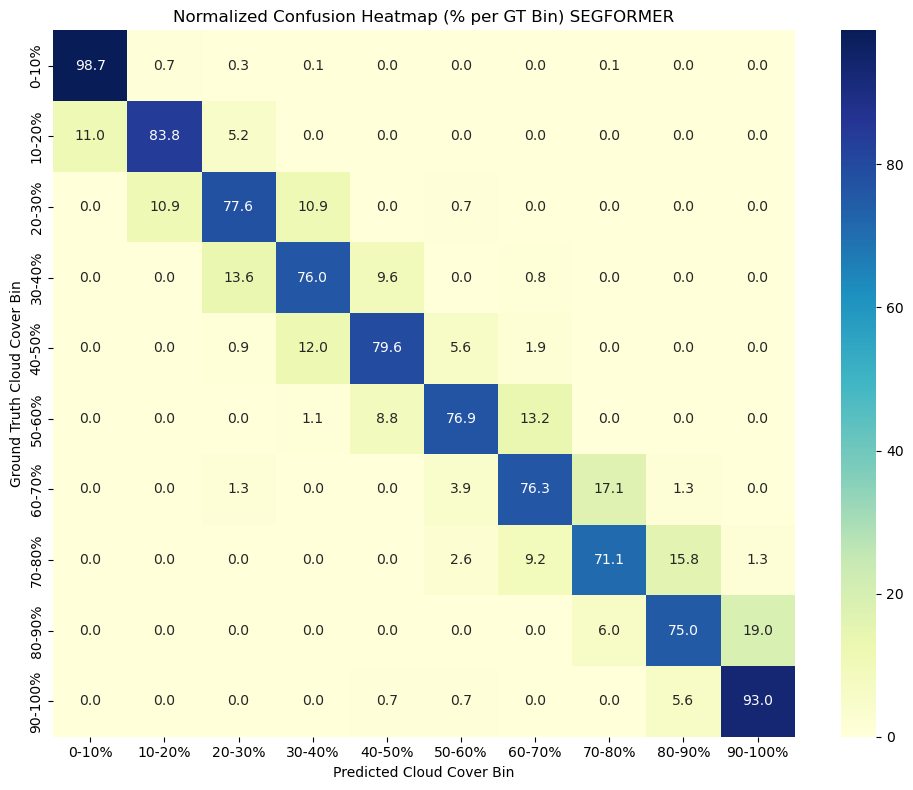

In [74]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_n.pt', segformer_test_loader, device, model_type='segformer')

### Balanced data, unnormalized cloud masking

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2329/2329 [05:15<00:00,  7.39it/s]



📊 Test Accuracy: 0.9825, Test IoU: 0.9061

📈 Sensitivity (Recall for clouds): 0.9631
📉 Specificity (Recall for clear):  0.9878


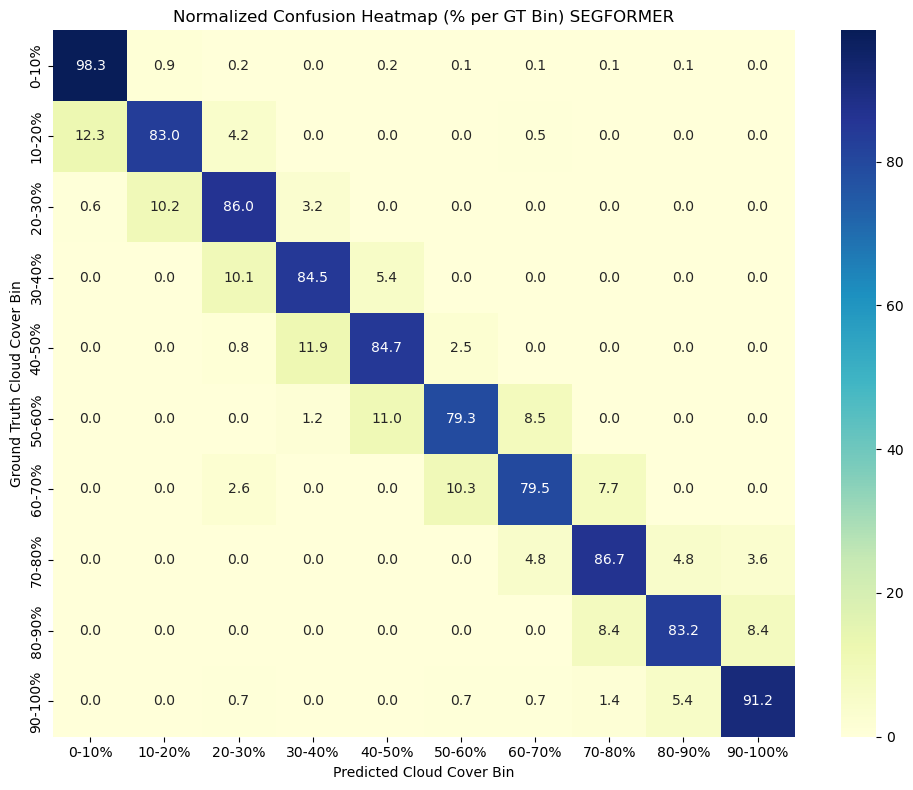

In [18]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_b.pt', segformer_test_loader, device, model_type='segformer')

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2343/2343 [05:18<00:00,  7.35it/s]



📊 Test Accuracy: 0.9840, Test IoU: 0.8703

📈 Sensitivity (Recall for clouds): 0.9669
📉 Specificity (Recall for clear):  0.9886


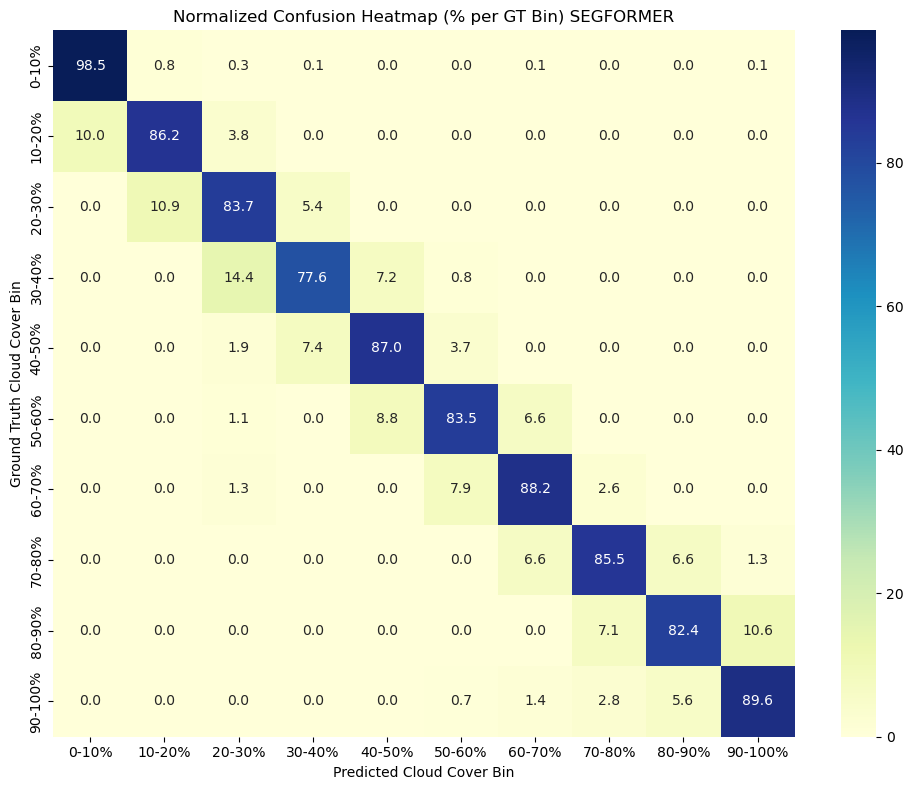

In [72]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_b.pt', segformer_test_loader, device, model_type='segformer')

### Balanced data, normalized cloud masking

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2329/2329 [05:15<00:00,  7.39it/s]



📊 Test Accuracy: 0.9832, Test IoU: 0.9089

📈 Sensitivity (Recall for clouds): 0.9652
📉 Specificity (Recall for clear):  0.9882


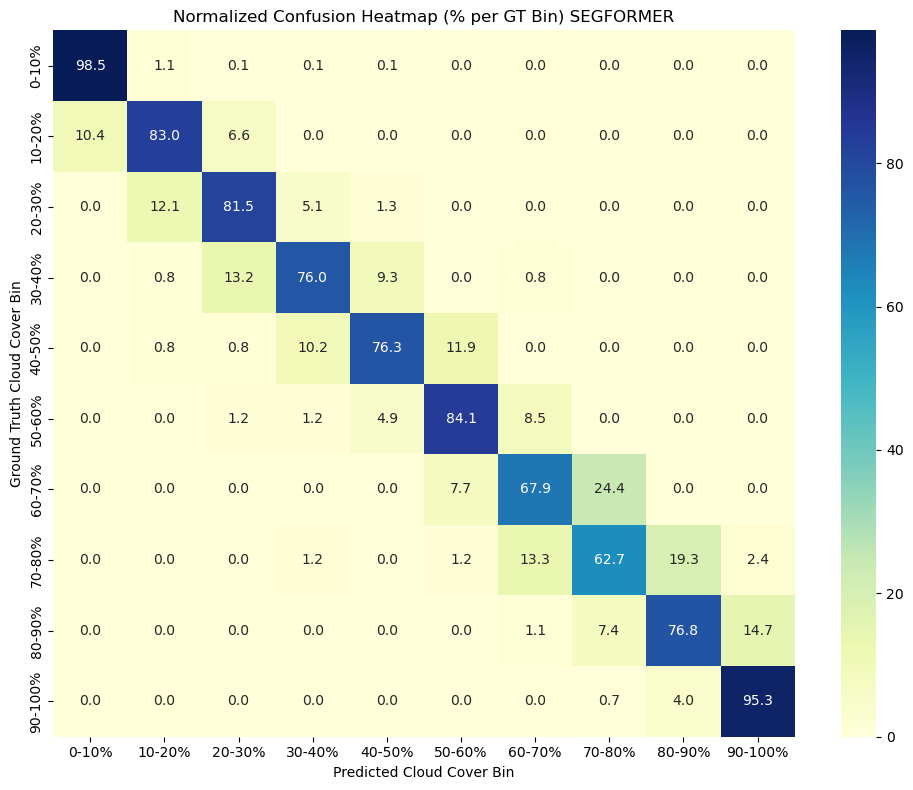

In [12]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_b_n.pt', segformer_test_loader, device, model_type='segformer')

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2343/2343 [05:09<00:00,  7.57it/s]



📊 Test Accuracy: 0.9836, Test IoU: 0.8689

📈 Sensitivity (Recall for clouds): 0.9689
📉 Specificity (Recall for clear):  0.9876


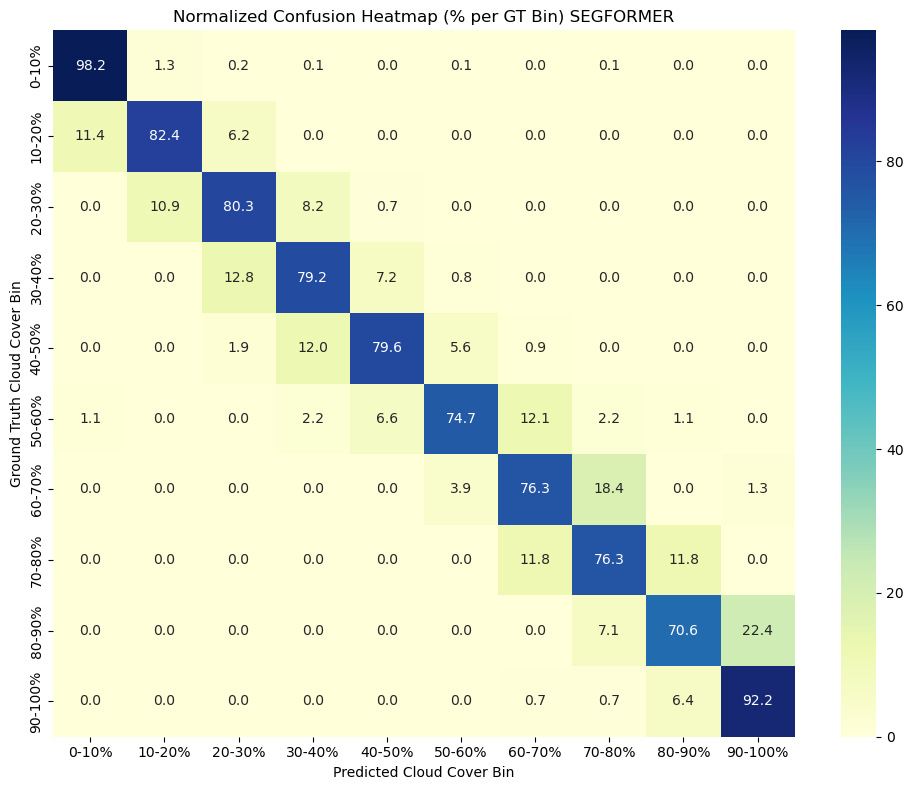

In [73]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_b_n.pt', segformer_test_loader, device, model_type='segformer')

### Balanced data, unnormalized cloud masking (finetuned)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2343/2343 [06:45<00:00,  5.78it/s]



📊 Test Accuracy: 0.9884, Test IoU: 0.8875

📈 Sensitivity (Recall for clouds): 0.9788
📉 Specificity (Recall for clear):  0.9909


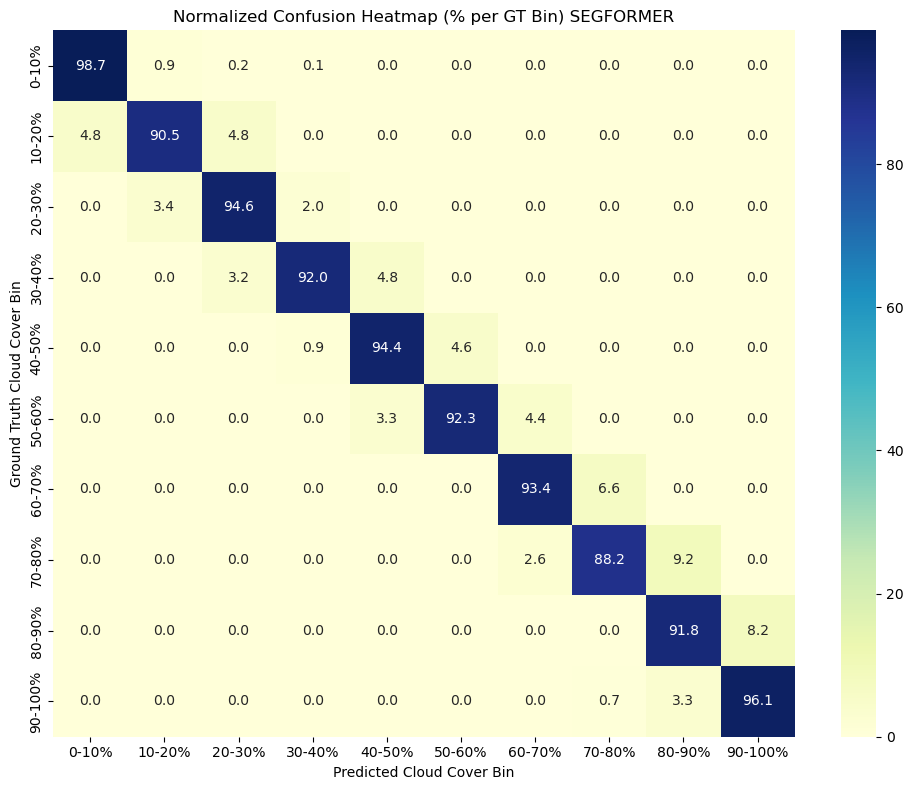

In [14]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_0.5_b.pt', segformer_test_loader, device, model_type='segformer')

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 2343/2343 [06:24<00:00,  6.10it/s]



📊 Test Accuracy: 0.9891, Test IoU: 0.8874

📈 Sensitivity (Recall for clouds): 0.9790
📉 Specificity (Recall for clear):  0.9917


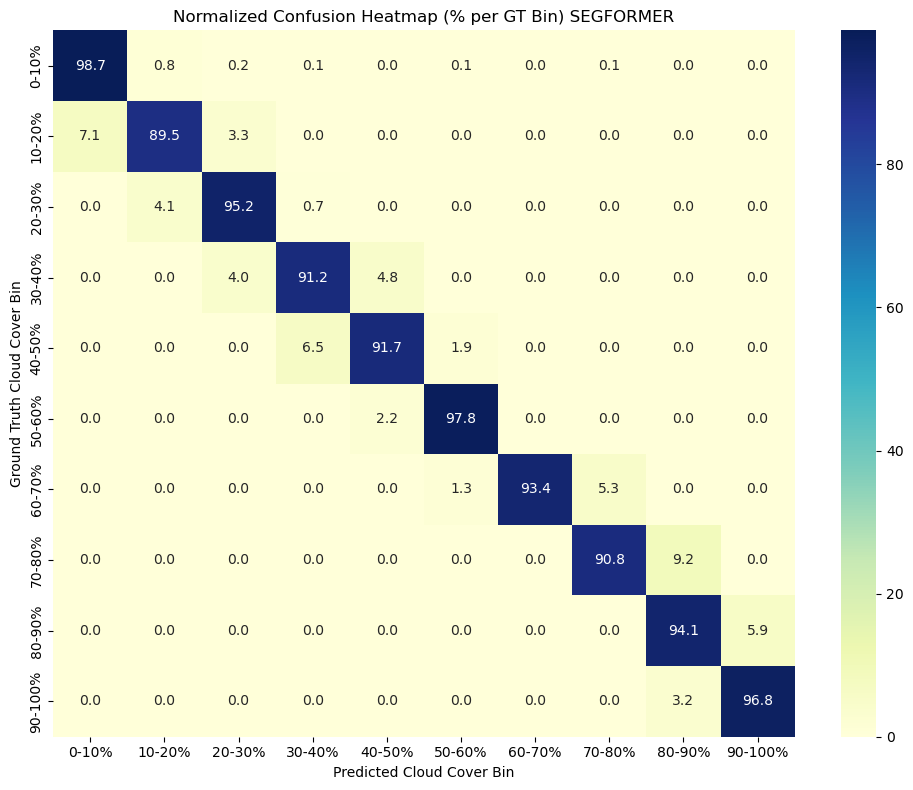

In [14]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_1_b.pt', segformer_test_loader, device, model_type='segformer')

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Testing: 100%|██████████| 4685/4685 [02:19<00:00, 33.58it/s]



📊 Test Accuracy: 0.9891, Test IoU: 0.9219

📈 Sensitivity (Recall for clouds): 0.9790
📉 Specificity (Recall for clear):  0.9917


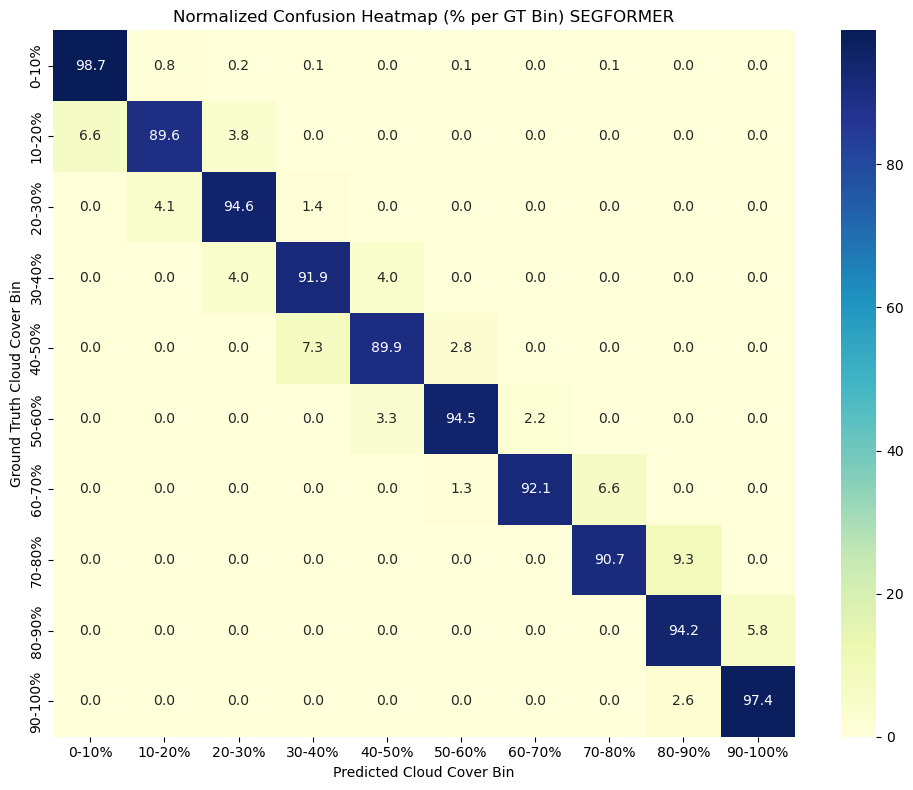

In [98]:
evaluate_model_with_heatmap('segformer_500_0.0001_16_1_b.pt', segformer_test_loader, device, model_type='segformer')

### -------------


In [ ]:
def visualize_predictions(model_path, loader, device, n=5):
    model = UNet(in_channels=3, out_channels=1).to(device)

    model_params = torch.load(model_path)
    model.load_state_dict(model_params['model_state_dict'])

    model.eval()
    
    print("Model loaded")
    
    # Randomly pick a batch index
    # batch_idx = random.randint(0, len(loader) - 1)
    # batch = list(loader)[batch_idx]  # Force loader into list to allow indexing
    count = 0
    for batch in loader:
        images, masks = batch
        images = images.to(device)
        count += 1
        with torch.no_grad():
            preds = model(images).detach().cpu()
        print(preds.size())
        print(preds)
        if ( count > 10):
            break

    # Forward pass
        

    for i in range(min(n, images.size(0))):
        img = images[i].cpu().permute(1, 2, 0).numpy()
        true_mask = masks[i].squeeze().cpu().numpy()
        pred_mask = preds[i].squeeze().numpy()
        pred_mask = (pred_mask > 0.5).astype(np.float32)

        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(img)
        axs[0].set_title("Image")

        axs[1].imshow(true_mask, cmap='gray',vmin = 0, vmax = 1)
        axs[1].set_title("Ground Truth")

        axs[2].imshow(pred_mask, cmap='gray',vmin = 0, vmax = 1)
        axs[2].set_title("Predicted")

        for ax in axs:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

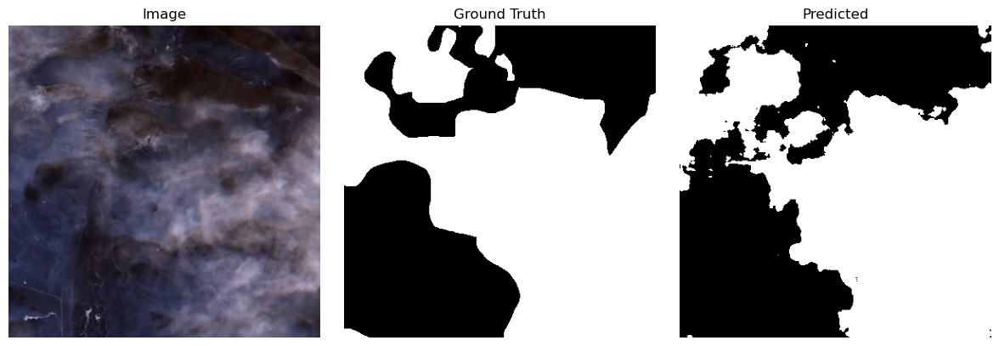

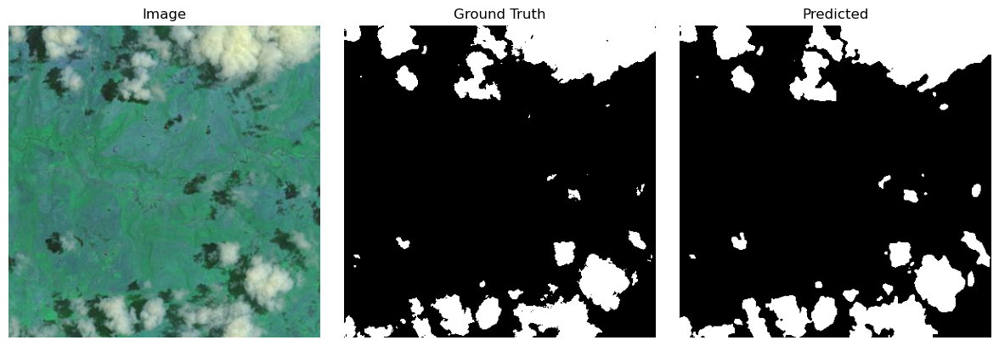

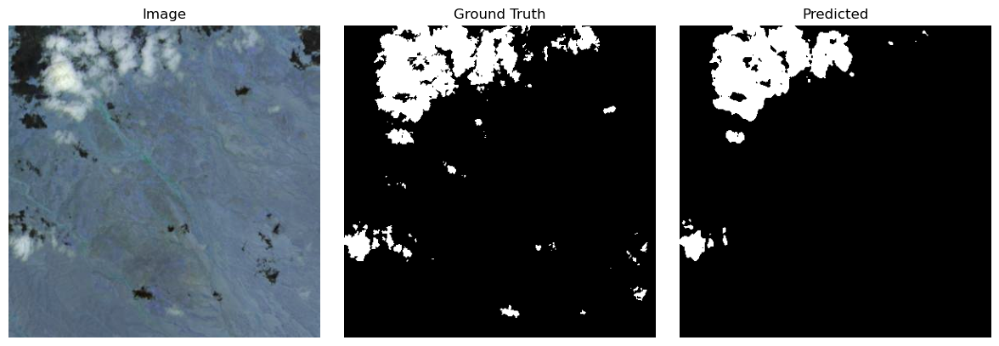

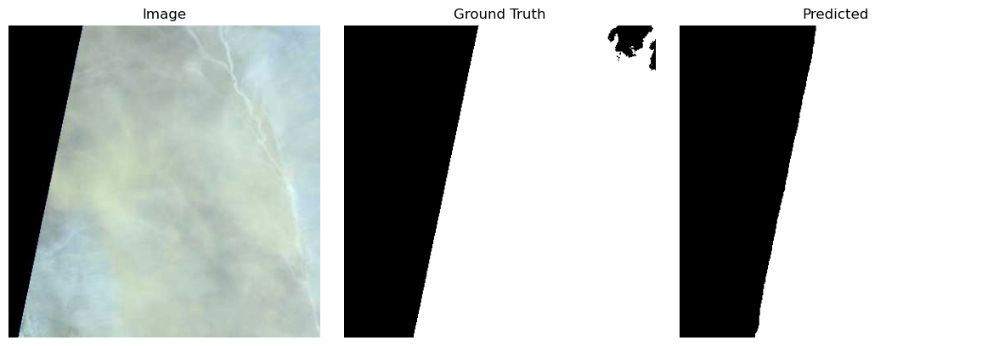

In [19]:
visualize_predictions('unet_200_1e-4_8', test_loader, device)

In [ ]:
def visualize_segformer_predictions(checkpoint_path, loader, device, n=1):
    # Load the model
    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b0-finetuned-ade-512-512",
        num_labels=2,
        ignore_mismatched_sizes=True
    )
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()

    total = len(loader.dataset)

    # Pick n unique random indices  
    random_indices = random.sample(range(total), n)

    # Create subset loader with those n items
    subset = Subset(loader.dataset, random_indices)
    subset_loader = DataLoader(subset, batch_size=n, shuffle=False)

    # Get the batch
    batch = next(iter(subset_loader))
    images = batch["pixel_values"].to(device)
    masks = batch["mask"].to(device)
    
    
    with torch.no_grad():
        outputs = model(pixel_values=images)
        logits = outputs.logits  # (B, num_labels, H, W)

    print(logits)
    # Get predictions (take argmax across the class dimension)
    preds = torch.argmax(logits, dim=1).cpu().numpy()

    for i in range(min(n, images.size(0))):
        # Convert image to HWC and handle NaNs/Infs
        img = images[i].cpu().permute(1, 2, 0).numpy()
        img = np.nan_to_num(img, nan=0.0, posinf=0.0, neginf=0.0)

        # Normalize for display
        img_min = img.min()
        img_max = img.max()
        if img_max != img_min:
            img = (img - img_min) / (img_max - img_min)
        else:
            img = np.zeros_like(img)

        # Resize image to 384x384
        img_resized = cv2.resize(img, (384, 384), interpolation=cv2.INTER_LINEAR)

        # Resize masks with NEAREST to preserve labels
        true_mask = masks[i].squeeze().cpu().numpy()
        true_mask_resized = cv2.resize(true_mask, (384, 384), interpolation=cv2.INTER_NEAREST)

        pred_mask = preds[i]
        pred_mask_resized = cv2.resize(pred_mask, (384, 384), interpolation=cv2.INTER_NEAREST)

        # Plot
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(img_resized)
        axs[0].set_title("Image")

        axs[1].imshow(true_mask_resized, cmap='gray', vmin=0, vmax=1)
        axs[1].set_title("Ground Truth")

        axs[2].imshow(pred_mask_resized, cmap='gray', vmin=0, vmax=1)
        axs[2].set_title("Predicted")

        for ax in axs:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

In [ ]:
def visualize_segformer_predictions_dual_model(
    checkpoint_path_1, checkpoint_path_2, loader, device, n=5
):
    # Load Model 1
    model1 = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b0-finetuned-ade-512-512",
        num_labels=2,
        ignore_mismatched_sizes=True
    )
    checkpoint1 = torch.load(checkpoint_path_1, map_location=device)
    model1.load_state_dict(checkpoint1['model_state_dict'])
    model1.to(device)
    model1.eval()

    # Load Model 2
    model2 = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b0-finetuned-ade-512-512",
        num_labels=2,
        ignore_mismatched_sizes=True
    )
    checkpoint2 = torch.load(checkpoint_path_2, map_location=device)
    model2.load_state_dict(checkpoint2['model_state_dict'])
    model2.to(device)
    model2.eval()

    # Random sample
    total = len(loader.dataset)
    random_indices = random.sample(range(total), n)
    subset = Subset(loader.dataset, random_indices)
    subset_loader = DataLoader(subset, batch_size=n, shuffle=False)
    batch = next(iter(subset_loader))
    images = batch["pixel_values"].to(device)
    masks = batch["mask"].to(device)

    # Get predictions from both models
    with torch.no_grad():
        preds1 = torch.argmax(model1(pixel_values=images).logits, dim=1).cpu().numpy()
        preds2 = torch.argmax(model2(pixel_values=images).logits, dim=1).cpu().numpy()

    for i in range(min(n, images.size(0))):
        # Image
        img = images[i].cpu().permute(1, 2, 0).numpy()
        img = np.nan_to_num(img, nan=0.0, posinf=0.0, neginf=0.0)
        img_min = img.min()
        img_max = img.max()
        if img_max != img_min:
            img = (img - img_min) / (img_max - img_min)
        else:
            img = np.zeros_like(img)
        img_resized = cv2.resize(img, (384, 384), interpolation=cv2.INTER_LINEAR)

        # Masks
        true_mask = masks[i].squeeze().cpu().numpy()
        true_mask_resized = cv2.resize(true_mask, (384, 384), interpolation=cv2.INTER_NEAREST)

        pred1_resized = cv2.resize(preds1[i], (384, 384), interpolation=cv2.INTER_NEAREST)
        pred2_resized = cv2.resize(preds2[i], (384, 384), interpolation=cv2.INTER_NEAREST)

        # Plot 1x4: Image | GT | Model1 | Model2
        fig, axs = plt.subplots(1, 4, figsize=(16, 4))
        axs[0].imshow(img_resized)
        axs[0].set_title("Image")

        axs[1].imshow(true_mask_resized, cmap='gray', vmin=0, vmax=1)
        axs[1].set_title("Ground Truth")

        axs[2].imshow(pred1_resized, cmap='gray', vmin=0, vmax=1)
        axs[2].set_title("Alpha = 0.5 Prediction")

        axs[3].imshow(pred2_resized, cmap='gray', vmin=0, vmax=1)
        axs[3].set_title("Alpha = 1 Prediction")

        for ax in axs:
            ax.axis('off')

        plt.tight_layout()
        plt.show()


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpo

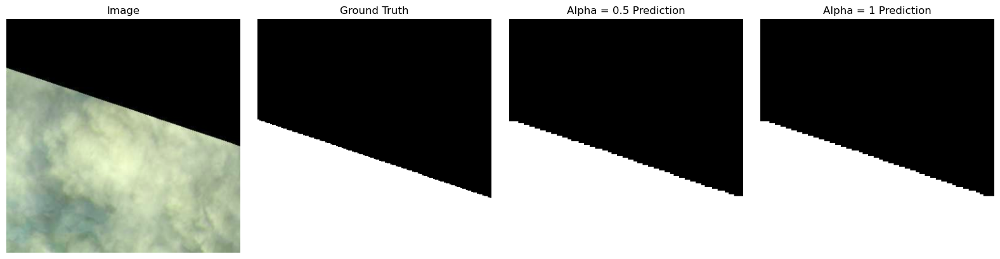

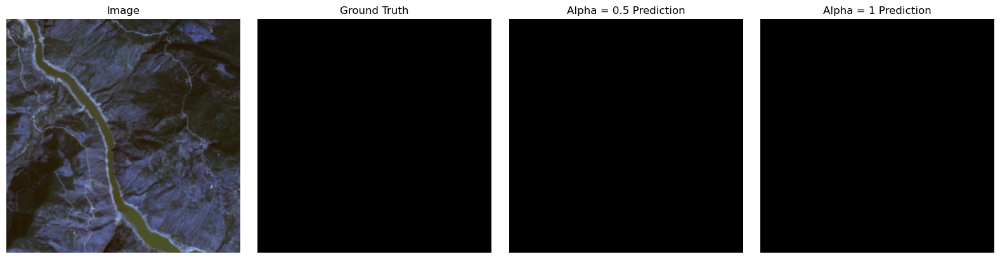

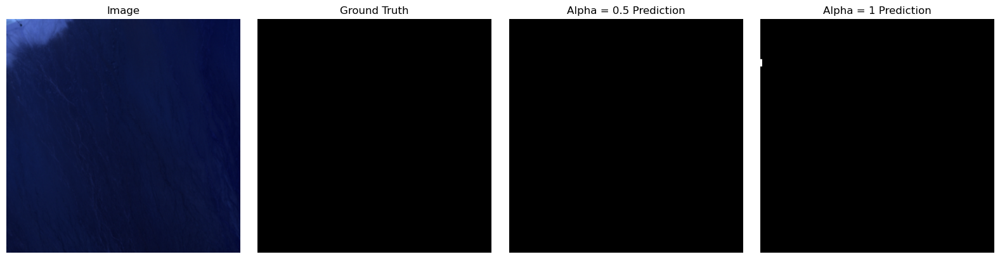

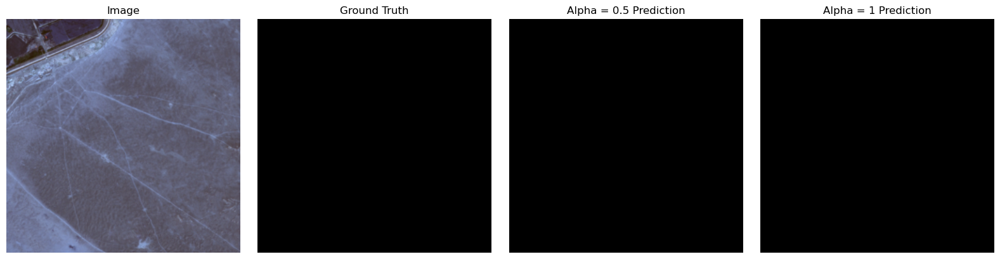

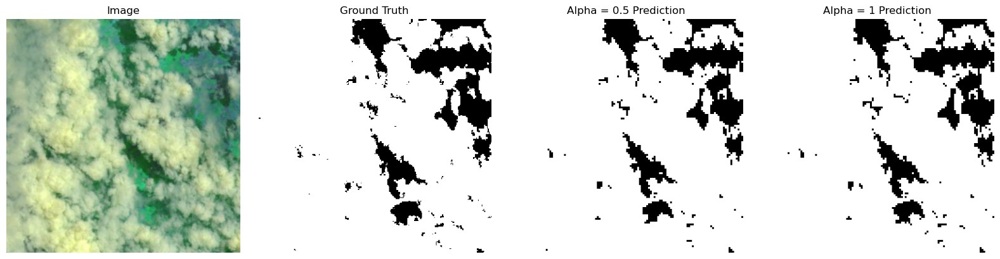

In [65]:
visualize_segformer_predictions_dual_model(
    'segformer_500_0.0001_16_0.5_b.pt','segformer_500_0.0001_16_1_b.pt',
    segformer_test_loader, device, n=5
)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpo

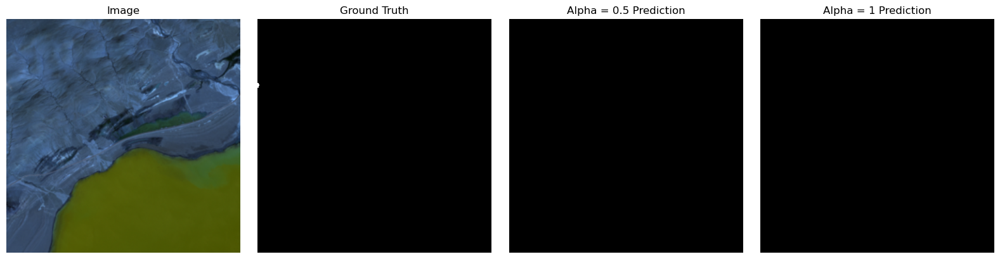

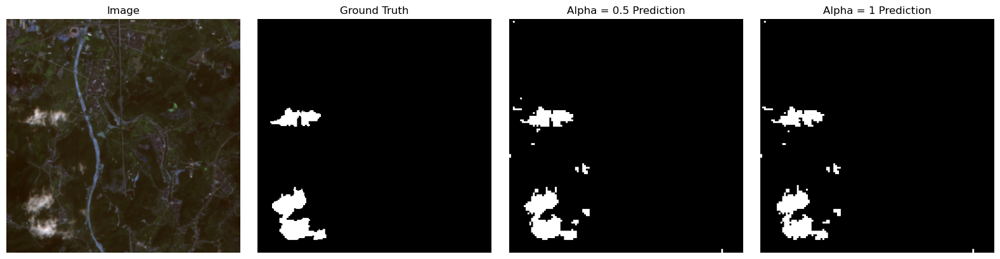

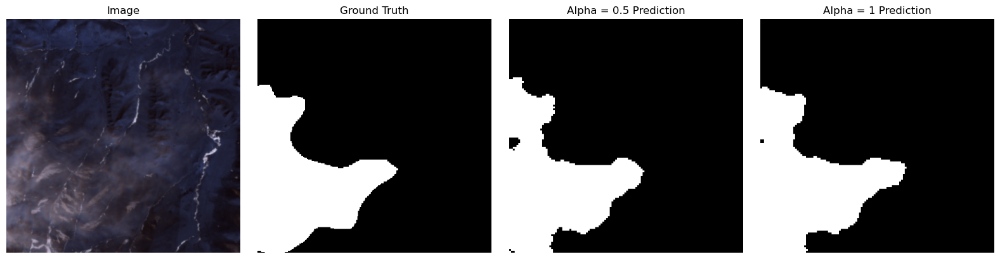

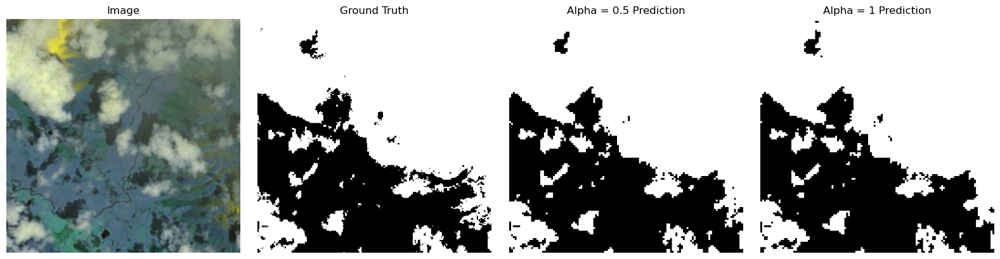

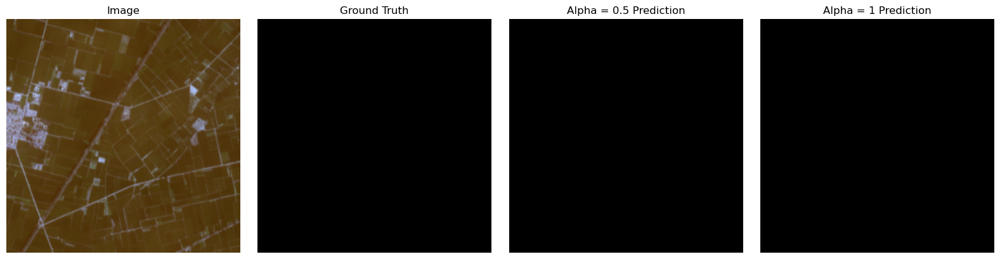

In [60]:
visualize_segformer_predictions_dual_model(
    'segformer_500_0.0001_16_0.5_b.pt','segformer_500_0.0001_16_1_b.pt',
    segformer_test_loader, device, n=5
)

In [ ]:
def visualize_side_by_side(unet_model_path, unet_loader, segformer_model_path, segformer_loader, n = 5):
    

In [29]:
visualize_segformer_predictions('segformer_500_0.0001_16_b_n.pt', segformer_test_loader, device, n=1)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tensor([[[[ 2.1019,  2.6296,  2.8710,  ...,  4.0315,  3.4333,  3.1240],
          [ 3.3320,  4.4740,  4.2603,  ...,  5.1645,  4.2606,  4.3334],
          [ 2.7932,  3.1406,  2.8589,  ...,  5.0307,  5.5413,  5.1593],
          ...,
          [ 2.8393,  2.7786,  2.0510,  ...,  3.7113,  2.4088,  2.3879],
          [ 1.8893,  2.0734,  1.6201,  ...,  3.0941,  2.1739,  2.8553],
          [ 1.3624,  2.7151,  1.4718,  ...,  2.7283,  2.1921,  1.9615]],

         [[-1.6584, -2.0278, -2.3041,  ..., -3.9291, -3.5206, -3.3212],
          [-2.4993, -3.6370, -3.5168,  ..., -5.1297, -4.4043, -4.4018],
          [-2.1981, -2.6554, -2.0971,  ..., -4.8988, -5.5326, -5.0751],
          ...,
          [-2.3661, -2.4480, -1.9775,  ..., -3.8613, -2.5484, -2.5867],
          [-1.6292, -1.9050, -1.4717,  ..., -3.2916, -2.4142, -2.7740],
          [-1.2237, -1.9284, -1.3461,  ..., -2.3317, -2.1298, -2.1759]]]],
       device='cuda:0')


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


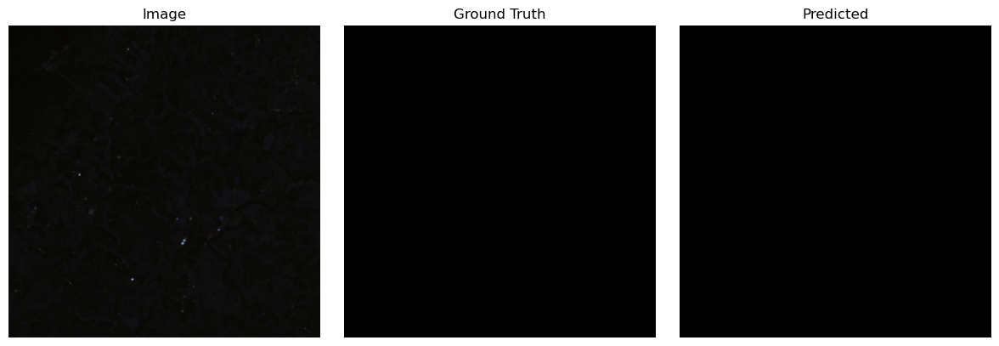

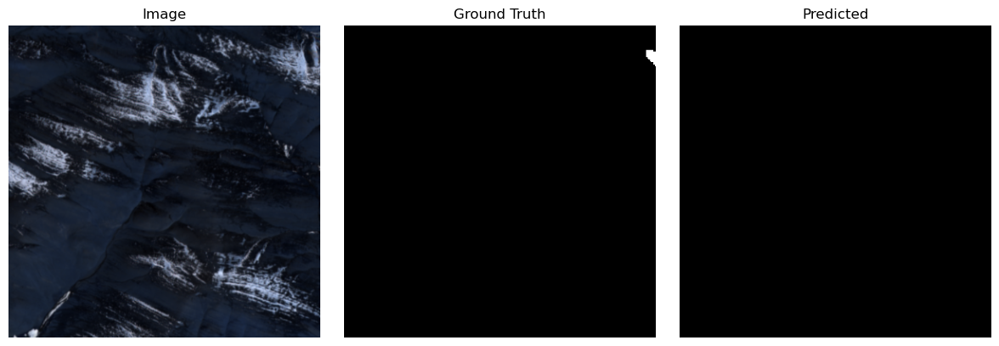

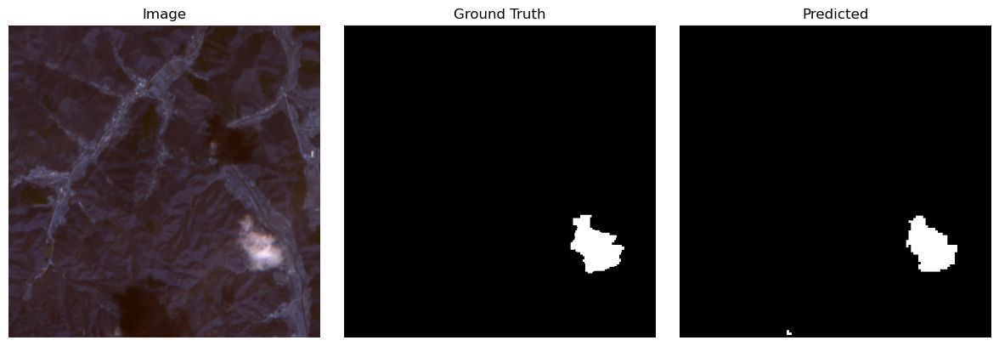

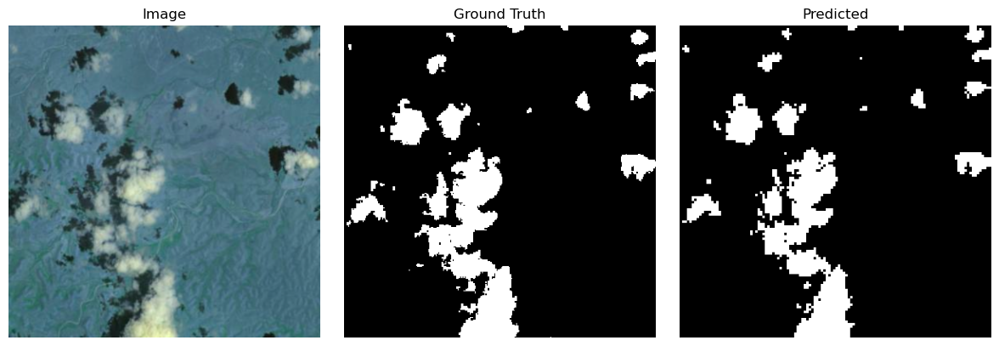

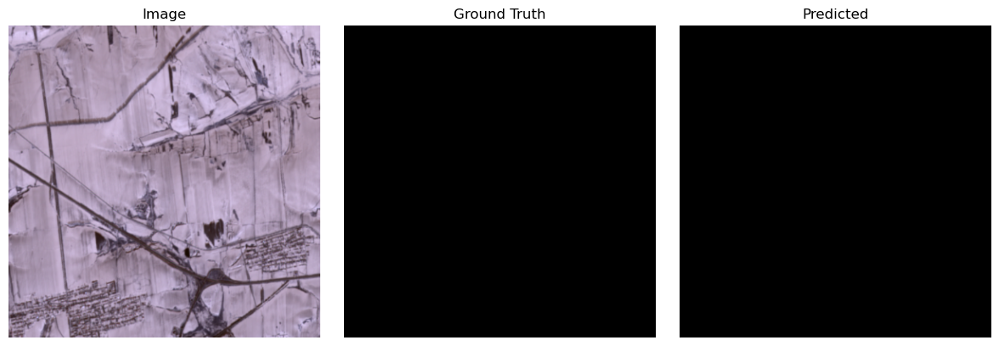

In [72]:
visualize_segformer_predictions('segformer_500_0.0001_16_b_n.pt', segformer_test_loader, device, n=5)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


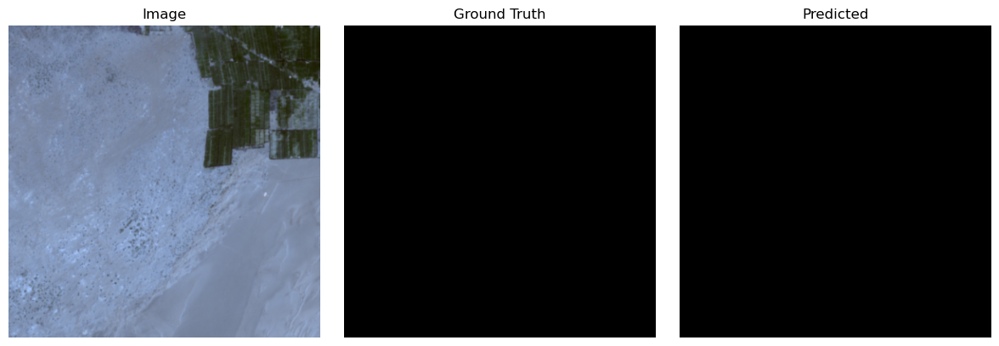

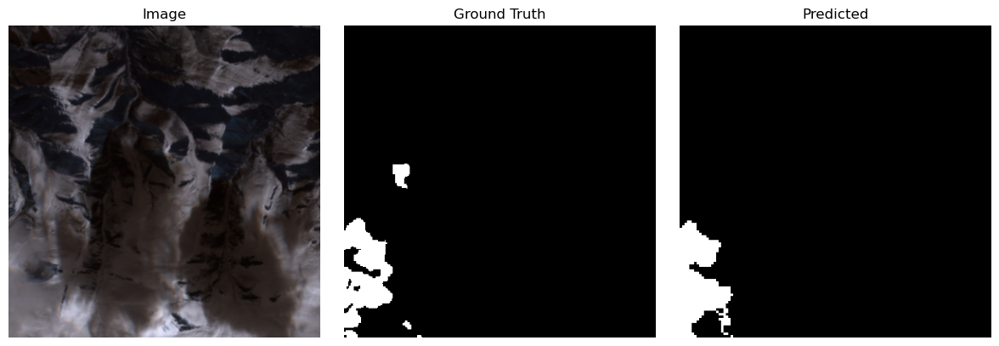

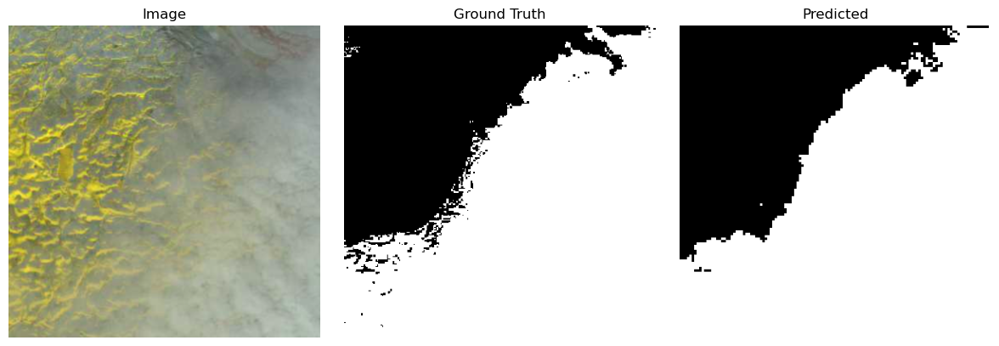

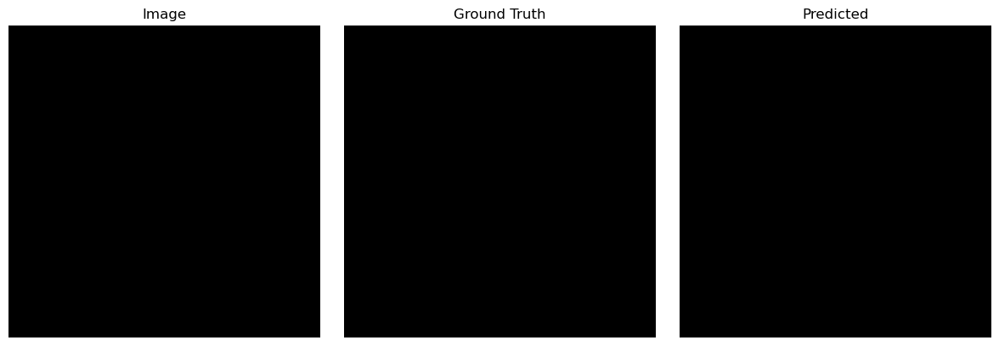

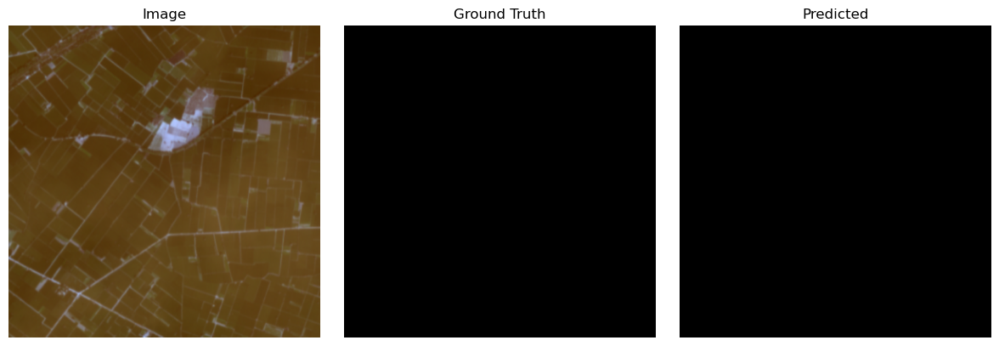

In [ ]:
visualize_segformer_predictions('segformer_500_0.0001_16_0.5_b.pt', segformer_test_loader, device, n=5)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


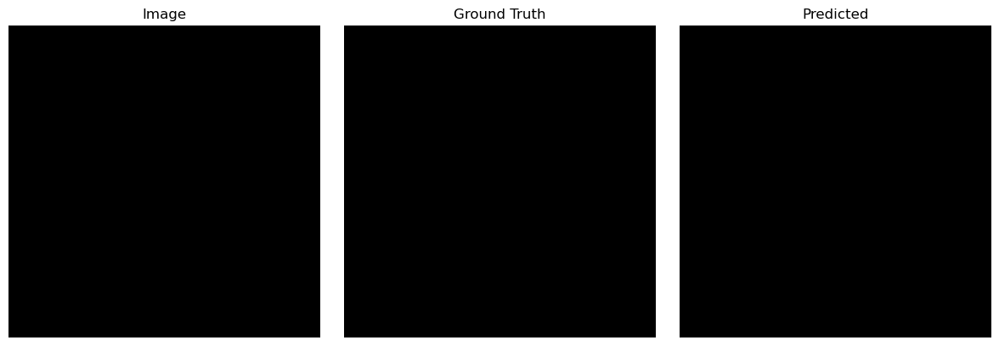

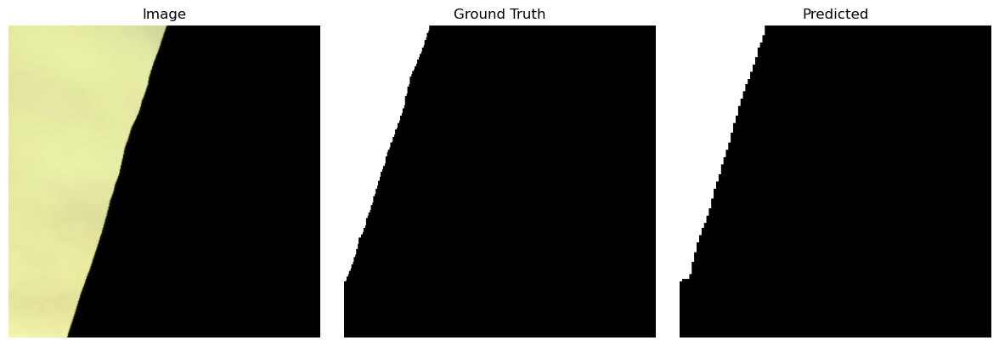

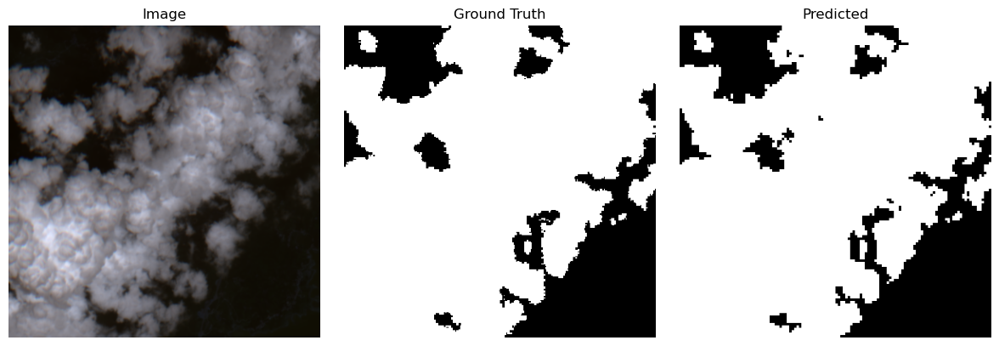

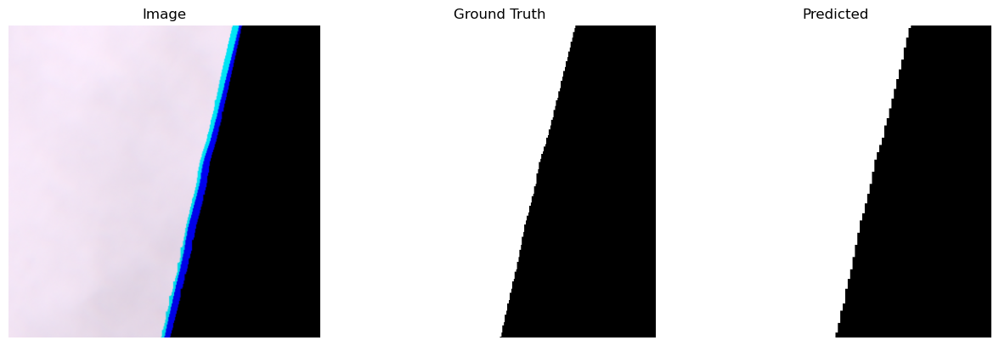

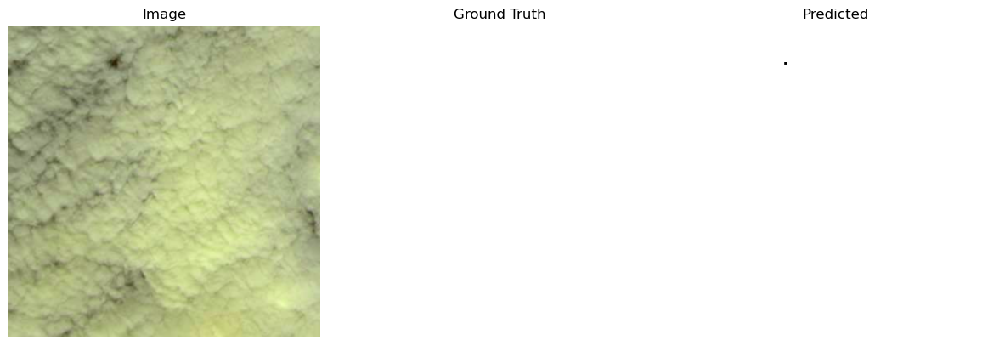

In [54]:
visualize_segformer_predictions('segformer_500_0.0001_16_1_b.pt', segformer_test_loader, device, feature_extractor, n=5)

In [118]:
def visualize_side_by_side(unet_model_path, segformer_model_path, loader, device, n=5):
    def run_unet(model_path, images):
        model = UNet(in_channels=3, out_channels=1).to(device)
        model.load_state_dict(torch.load(model_path)['model_state_dict'])
        model.eval()
        with torch.no_grad():
            preds = model(images)
            preds = (preds > 0.5).float().squeeze(1).long()
        return preds

    def run_segformer(model_path, images):
        model = SegformerForSemanticSegmentation.from_pretrained(
            "nvidia/segformer-b0-finetuned-ade-512-512",
            num_labels=2,
            ignore_mismatched_sizes=True
        )
        checkpoint = torch.load(model_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        model.to(device)
        model.eval()
        images_resized = F.interpolate(images, size=(512, 512), mode='bilinear', align_corners=False)
        with torch.no_grad():
            outputs = model(pixel_values=images_resized)
            logits = outputs.logits
            preds = logits.argmax(dim=1)
            preds = F.interpolate(preds.unsqueeze(1).float(), size=(384, 384), mode='nearest').squeeze(1).long()
        return preds

    shown = 0
    all_images = []
    for batch in loader:
        if shown >= n:
            break

        images = batch["pixel_values"].to(device)
        masks = batch["mask"].to(device)

        unet_preds = run_unet(unet_model_path, images)
        segformer_preds = run_segformer(segformer_model_path, images)

        for i in range(images.shape[0]):
            if shown >= n:
                break

            img = images[i].cpu().permute(1, 2, 0).numpy()
            gt_mask = masks[i].cpu().numpy()
            unet_mask = unet_preds[i].cpu().numpy()
            segformer_mask = segformer_preds[i].cpu().numpy()

            all_images.append((img, gt_mask, unet_mask, segformer_mask))
            shown += 1

    # Plot all at once
    fig, axs = plt.subplots(n, 4, figsize=(16, 4 * n))
    for idx, (img, gt, unet, segf) in enumerate(all_images):
        axs[idx, 0].imshow(img)
        axs[idx, 0].set_title("Input Image")
        axs[idx, 1].imshow(gt, cmap="gray")
        axs[idx, 1].set_title("Ground Truth")
        axs[idx, 2].imshow(unet, cmap="gray")
        axs[idx, 2].set_title("U-Net Prediction")
        axs[idx, 3].imshow(segf, cmap="gray")
        axs[idx, 3].set_title("SegFormer-B0 Prediction")
        for ax in axs[idx]:
            ax.axis("off")
    plt.tight_layout()
    plt.show()


In [112]:
test_loader = DataLoader(segformer_test_dataset, batch_size=5, shuffle=True, num_workers=0)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


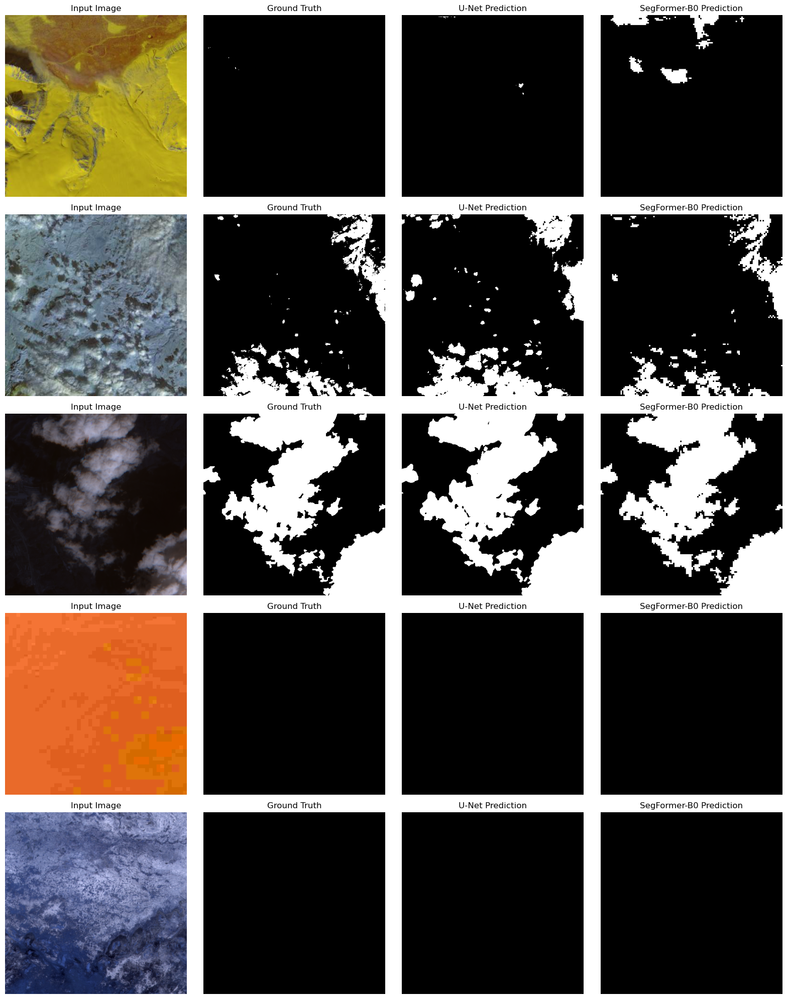

In [127]:
visualize_side_by_side('unet_500_0.0001_16_2','segformer_500_0.0001_16_2_b.pt',test_loader,device)